In [34]:

import numpy as np
import pandas as pd

import sklearn
from sklearn import metrics

import shap
import statsmodels.api as sm

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours

import lightgbm as lgb

import sys
sys.path.append('../')
import importlib
import os
from joblib import dump, load

import model_util
importlib.reload(model_util)
from model_util import get_estimator_probabilities, get_scoring_metrics

import feature_sets
importlib.reload(feature_sets)

import feature_sets_rnfl
importlib.reload(feature_sets_rnfl)

#from sklearnex import patch_sklearn
#patch_sklearn()


<module 'feature_sets_rnfl' from '/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../feature_sets_rnfl.py'>

In [2]:
print(np.__version__)

2.1.3


# Load data

- Use min-max scaled X_train and X_test for all models for consistency, even if not required
- Use miceforest imputed data for all models (same reasoning)

<br>

### tte: 3 years

In [3]:
X_train_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_3year_tte.pkl')
y_train_3year_tte = load('../data/imputed/IOPsubcohort_y_train_3year_tte.pkl')

X_test_imputed_scaled_3year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_3year_tte.pkl')
y_test_3year_tte = load('../data/imputed/IOPsubcohort_y_test_3year_tte.pkl')

In [4]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_3year_tte = {
    'LR': 'logistic_regression_sgd_3year_tte',
    'SVM': 'svm_3year_tte',
    'KNN': 'knn_3year_tte',
    'RF': 'randomforest_3year_tte',
    'XGBoost': 'xgboost_3year_tte',
    'LightGBM': 'lightgbm_3year_tte',
}

<br>

### tte: 5 years

In [2]:
X_train_imputed_scaled_5year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_5year_tte.pkl')
y_train_5year_tte = load('../data/imputed/IOPsubcohort_y_train_5year_tte.pkl')

X_test_imputed_scaled_5year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_5year_tte.pkl')
y_test_5year_tte = load('../data/imputed/IOPsubcohort_y_test_5year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_5year_tte = {
    'LR': 'logistic_regression_sgd_5year_tte',
    'SVM': 'svm_5year_tte',
    'KNN': 'knn_5year_tte',
    'RF': 'randomforest_5year_tte',
    'XGBoost': 'xgboost_5year_tte',
    'LightGBM': 'lightgbm_5year_tte',
}

<br>

### tte: 10 years

In [11]:
X_train_imputed_scaled_10year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_10year_tte.pkl')
y_train_10year_tte = load('../data/imputed/IOPsubcohort_y_train_10year_tte.pkl')

X_test_imputed_scaled_10year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_10year_tte.pkl')
y_test_10year_tte = load('../data/imputed/IOPsubcohort_y_test_10year_tte.pkl')

In [12]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_10year_tte = {
    'LR': 'logistic_regression_sgd_10year_tte',
    'SVM': 'svm_10year_tte',
    'KNN': 'knn_10year_tte',
    'RF': 'randomforest_10year_tte',
    'XGBoost': 'xgboost_10year_tte',
    'LightGBM': 'lightgbm_10year_tte',
}

<br>

### tte: 10 years (matched)

In [2]:
X_train_imputed_scaled_matched10year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_matched10year_tte.pkl')
y_train_matched10year_tte = load('../data/imputed/IOPsubcohort_y_train_matched10year_tte.pkl')

X_test_imputed_scaled_matched10year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_matched10year_tte.pkl')
y_test_matched10year_tte = load('../data/imputed/IOPsubcohort_y_test_matched10year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_matched10year_tte = {
    'LR': 'logistic_regression_sgd_matched10year_tte',
    'SVM': 'svm_matched10year_tte',
    'KNN': 'knn_matched10year_tte',
    'RF': 'randomforest_matched10year_tte',
    'XGBoost': 'xgboost_matched10year_tte',
    'LightGBM': 'lightgbm_matched10year_tte',
}

<br>

### tte: 10 years (IOP removed)

In [2]:
X_train_imputed_scaled_IOPremoved10year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_IOPremoved10year_tte.pkl')
y_train_IOPremoved10year_tte = load('../data/imputed/IOPsubcohort_y_train_IOPremoved10year_tte.pkl')

X_test_imputed_scaled_IOPremoved10year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_IOPremoved10year_tte.pkl')
y_test_IOPremoved10year_tte = load('../data/imputed/IOPsubcohort_y_test_IOPremoved10year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_IOPremoved10year_tte = {
    'LR': 'logistic_regression_sgd_IOPremoved10year_tte',
    'SVM': 'svm_IOPremoved10year_tte',
    'KNN': 'knn_IOPremoved10year_tte',
    'RF': 'randomforest_IOPremoved10year_tte',
    'XGBoost': 'xgboost_IOPremoved10year_tte',
    'LightGBM': 'lightgbm_IOPremoved10year_tte',
}

<br>

### tte: 10 years (RNFL models)

In [22]:
X_train_imputed_scaled_10year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_rnfl10year_tte.pkl')
y_train_IOPremoved10year_tte = load('../data/imputed/IOPsubcohort_y_train_rnfl10year_tte.pkl')

X_test_imputed_scaled_10year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_rnfl10year_tte.pkl')
y_test_10year_tte = load('../data/imputed/IOPsubcohort_y_test_rnfl10year_tte.pkl')

In [23]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_rnfl10year_tte = {
    'LR': 'logistic_regression_sgd_rnfl10year_tte',
    'SVM': 'svm_rnfl10year_tte',
    'KNN': 'knn_rnfl10year_tte',
    'RF': 'randomforest_rnfl10year_tte',
    'XGBoost': 'xgboost_rnfl10year_tte',
    'LightGBM': 'lightgbm_rnfl10year_tte',
}

<br>

### tte: 10 years (no IOP RNFL)

In [36]:
X_train_imputed_scaled_10year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_noIOPrnfl10year_tte.pkl')
y_train_IOPremoved10year_tte = load('../data/imputed/IOPsubcohort_y_train_noIOPrnfl10year_tte.pkl')

X_test_imputed_scaled_10year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_noIOPrnfl10year_tte.pkl')
y_test_10year_tte = load('../data/imputed/IOPsubcohort_y_test_noIOPrnfl10year_tte.pkl')

In [35]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_noIOPrnfl10year_tte = {
    'LR': 'logistic_regression_sgd_noIOPrnfl10year_tte',
    'SVM': 'svm_noIOPrnfl10year_tte',
    'KNN': 'knn_noIOPrnfl10year_tte',
    'RF': 'randomforest_noIOPrnfl10year_tte',
    'XGBoost': 'xgboost_noIOPrnfl10year_tte',
    'LightGBM': 'lightgbm_noIOPrnfl10year_tte',
}

<br>

<br>

# Model accuracy

- Compare algorithms per feature set
- Compare best-performing algorithms across feature sets

### Function defs

In [24]:
def compare_estimator_auroc_bar(estimator_dict, y, best_model, ax):
    #ax.set_xlabel('Model')
    #ax.set_ylabel('Area under the receiver operating characteristic curve (AUROC)')

    x_arr = np.array([])
    y_arr = np.array([])

    errorbar_low_arr = np.array([])
    errorbar_high_arr = np.array([])

    ax.axhline(color='k', linestyle='dotted', y=0.5, xmin=0.05, xmax=0.95, label=f'Baseline: 0.5', alpha=0.7)

    for display_name, vals in estimator_dict.items():
        model_name = vals['model_name']
        auroc = vals['auroc']
        auroc_CI_low = vals['auroc_CI_low']
        auroc_CI_high = vals['auroc_CI_high']

        x_arr = np.append(x_arr, model_name)
        y_arr = np.append(y_arr, auroc)
        errorbar_low_arr = np.append(errorbar_low_arr, auroc - auroc_CI_low)
        errorbar_high_arr = np.append(errorbar_high_arr, auroc_CI_high - auroc)

    sns.barplot(x=x_arr, y=y_arr, hue=x_arr, ax=ax, legend=False)
    
    for display_name, vals in estimator_dict.items():
        model_name = vals['model_name']
        auroc = vals['auroc']
        #ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8)
        if display_name == best_model:
            ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8, fontweight='bold')
        else:
            ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8)

    for label in ax.get_xticklabels():
        if label.get_text() == estimator_dict[best_model]['model_name']:
            label.set_fontweight('bold')
    
    #ax.bar_label(ax.containers[0], padding=40, fmt='%.3f')
    #ax.bar_label(ax.containers[0], padding=0, fmt='%.3f', label_type='center', fontsize=8)

    #for bar in ax.containers[0]:
    #     plt.text(bar.get_x(), 0.95, f'{bar.get_height():0.3f}')
    
    ax.errorbar(
        x=x_arr, y=y_arr,
        yerr = [errorbar_low_arr, errorbar_high_arr],
        fmt='none',
        ecolor='k',
        elinewidth=1,
        capsize=6,
    )

    ax.set_ylim([0, 1])
    ax.set_yticks(np.linspace(0, 1, 11))


    
    #if save_dir:
    #    plt.savefig(f'{save_dir}/bar_auroc.png', dpi=600, bbox_inches='tight', pad_inches=0)

    #plt.show()

In [25]:
# V2

def compare_estimator_roc(estimator_dict, y, ax):

    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    #ax.set_xlabel('1 - Specificity (false positive rate)')
    #ax.set_ylabel('Sensitivity (true positive rate)')

    ax.plot([0, 1], [0, 1], 'k:', label='Baseline: 0.500', alpha=0.7)

    for display_name, vals in estimator_dict.items():
        estimator = vals['estimator']
        label = vals['roc_label']
        X = vals['X']
        
        probabilities = get_estimator_probabilities(estimator, X)
        fpr_arr, tpr_arr, trial_t_arr = metrics.roc_curve(y, probabilities, pos_label=1, drop_intermediate=False)
        scoring_metrics = get_scoring_metrics(estimator, X, y)
        roc_auc = scoring_metrics['roc_auc']
        ax.plot(fpr_arr, tpr_arr, label=label, alpha=1)


    #ax.legend(loc='lower right')

    # if save_dir:
    #     plt.savefig(f'{save_dir}/roc.png', dpi=1000, bbox_inches='tight', pad_inches=0.1)

    #plt.show()

In [26]:
# V2

def compare_estimator_prc(estimator_dict, y, ax):

    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    #ax.set_xlabel('1 - Specificity (false positive rate)')
    #ax.set_ylabel('Sensitivity (true positive rate)')

    # Baseline = glaucoma prevalence
    n_pos = (y == 1).sum()
    n_total = len(y)
    baseline_y = n_pos / n_total
    ax.hlines(colors='k', linestyles='dotted', y=baseline_y, xmin=0, xmax=1, label=f'Baseline: {baseline_y:0.3f}', alpha=0.7)
   
    for display_name, vals in estimator_dict.items():
        estimator = vals['estimator']
        label = vals['roc_label']
        X = vals['X']
        
        probabilities = get_estimator_probabilities(estimator, X)
        precision, recall, pr_t = metrics.precision_recall_curve(y, probabilities, pos_label=1, drop_intermediate=True)
        pr_auc = metrics.auc(recall, precision)
        ax.plot(recall, precision, label=label, alpha=1)

 
    #ax.legend(loc='upper right', fontsize=8)


    # if save_dir:
    #     plt.savefig(f'{save_dir}/roc.png', dpi=1000, bbox_inches='tight', pad_inches=0.1)

    #plt.show()

### Compare algorithms for each feature set

In [16]:
compare_feature_set_dict = {
    'ophthalmic': feature_sets.ophthalmic_features['feature'].values,
    'demographic': feature_sets.demographic_features['feature'].values,
    'systemic': feature_sets.systemic_features['feature'].values,
    'lifestyle': feature_sets.lifestyle_features['feature'].values,

    'OD': feature_sets.OD_features['feature'].values,
    'SL': feature_sets.SL_features['feature'].values,
    'ODSL': feature_sets.ODSL_features['feature'].values,
    #'ODS': feature_sets.ODS_features['feature'].values,
    'DSL': feature_sets.DSL_features['feature'].values, # Primary-care focused       

    #'minimal_features_rfecv': feature_sets.minimal_features_rfecv['feature'].values
}

In [17]:
model_feature_dict = {
    'ophthalmic': feature_sets.ophthalmic_features['feature'].values,
    'demographic': feature_sets.demographic_features['feature'].values,
    'systemic': feature_sets.systemic_features['feature'].values,
    'lifestyle': feature_sets.lifestyle_features['feature'].values,

    'OD': feature_sets.OD_features['feature'].values,
    'SL': feature_sets.SL_features['feature'].values,
    'ODSL': feature_sets.ODSL_features['feature'].values,
    #'ODS': feature_sets.ODS_features['feature'].values,
    'DSL': feature_sets.DSL_features['feature'].values, # Primary-care focused       

    #'minimal_features_rfecv': feature_sets.minimal_features_rfecv['feature'].values
}

### IOP removed feature sets

In [7]:
removed_features = ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference', 
                    'Corneal hysteresis inter-eye difference', 
                    'Spherical equivalent', 'Corneal resistance factor', 
                    'Speech reception threshold', 'Corneal hysteresis',
                    'Tinnitus frequency (self-reported)', 'Arterial stiffness index', 'Private healthcare utilisation', 
                    'Exercise (summed MET minutes per week)', 'Total household income']

# this removes all 'opthalmic' features
model_feature_dict = compare_feature_set_dict = {
    #'ophthalmic': feature_sets.ophthalmic_features['feature'].values[~np.isin(feature_sets.ophthalmic_features['feature'].values, removed_features)],
    'demographic': feature_sets.demographic_features['feature'].values[~np.isin(feature_sets.demographic_features['feature'].values, removed_features)],
    'systemic': feature_sets.systemic_features['feature'].values[~np.isin(feature_sets.systemic_features['feature'].values, removed_features)],
    'lifestyle': feature_sets.lifestyle_features['feature'].values[~np.isin(feature_sets.lifestyle_features['feature'].values, removed_features)],

    #'OD': feature_sets.OD_features['feature'].values[~np.isin(feature_sets.OD_features['feature'].values, removed_features)],
    'SL': feature_sets.SL_features['feature'].values[~np.isin(feature_sets.SL_features['feature'].values, removed_features)],
    #'ODSL': feature_sets.ODSL_features['feature'].values[~np.isin(feature_sets.ODSL_features['feature'].values, removed_features)],
    'DSL': feature_sets.DSL_features['feature'].values[~np.isin(feature_sets.DSL_features['feature'].values, removed_features)],
    'DS': feature_sets.DS_features['feature'].values[~np.isin(feature_sets.DS_features['feature'].values, removed_features)],
    'DL': feature_sets.DL_features['feature'].values[~np.isin(feature_sets.DL_features['feature'].values, removed_features)]}


### RNFL feature sets

In [29]:
model_feature_dict = compare_feature_set_dict = {
    'ophthalmic': feature_sets_rnfl.ophthalmic_features['feature'].values,
    'demographic': feature_sets_rnfl.demographic_features['feature'].values,
    'systemic': feature_sets_rnfl.systemic_features['feature'].values,
    'lifestyle': feature_sets_rnfl.lifestyle_features['feature'].values,

    'OD': feature_sets_rnfl.OD_features['feature'].values,
    'SL': feature_sets_rnfl.SL_features['feature'].values,
    'ODSL': feature_sets_rnfl.ODSL_features['feature'].values,
    'DSL': feature_sets_rnfl.DSL_features['feature'].values, 
}

<br>

<br>

<br>

## tte: 10 years

In [18]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_10year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_10year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_10year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_10year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_10year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_10year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_10year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_10year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_10year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_10year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 2.2785304526212528e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.791821,0.792 (0.703 - 0.871),0.771 (0.648 - 0.884),0.791 (0.786 - 0.797),0.008 (0.006 - 0.011),0.999 (0.999 - 1.000),0.016 (0.011 - 0.021),0.023 (0.011 - 0.043)
SVM,svm_10year_tte,C: 5.992981628637861 kernel: rbf gamma: 1.3197994923934833e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.784127,0.784 (0.695 - 0.864),0.688 (0.550 - 0.815),0.836 (0.832 - 0.841),0.009 (0.006 - 0.012),0.999 (0.999 - 1.000),0.018 (0.012 - 0.025),0.023 (0.011 - 0.046)
KNN,knn_10year_tte,n_neighbors: 339 weights: uniform metric: euclidean algorithm: brute,0.760961,0.761 (0.677 - 0.839),0.562 (0.419 - 0.703),0.898 (0.893 - 0.902),0.012 (0.008 - 0.017),0.999 (0.998 - 0.999),0.024 (0.015 - 0.032),0.030 (0.014 - 0.059)
RF,randomforest_10year_tte,n_estimators: 185 max_depth: 24 max_features: 0.9251645910047825 min_samples_leaf: 1193 max_samples: 0.9072862857464994 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.796159,0.796 (0.716 - 0.868),0.729 (0.596 - 0.851),0.825 (0.820 - 0.830),0.009 (0.006 - 0.012),0.999 (0.999 - 1.000),0.018 (0.012 - 0.024),0.019 (0.009 - 0.036)
XGBoost,xgboost_10year_tte,n_estimators: 258 learning_rate: 0.006364397363577267 max_depth: 4 subsample: 0.8425253288581035 colsample_bytree: 0.7996720735882503 gamma: 0.004075569125753535 lambda: 0.008685619764643843 min_child_weight: 4.965167305630569 max_bin: 263 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.796077,0.796 (0.714 - 0.871),0.708 (0.571 - 0.836),0.837 (0.832 - 0.842),0.010 (0.006 - 0.013),0.999 (0.999 - 1.000),0.019 (0.013 - 0.025),0.038 (0.016 - 0.077)
LightGBM,lightgbm_10year_tte,n_estimators: 438 max_bin: 154 learning_rate: 0.001114701955592749 max_depth: 5 num_leaves: 121 bagging_fraction: 0.586583374323361 feature_fraction: 0.9316809716266431 lambda_l2: 0.005698846112987398 min_sum_hessian_in_leaf: 3.6392271706443267 min_data_in_leaf: 556 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.801851,0.802 (0.721 - 0.875),0.729 (0.596 - 0.851),0.845 (0.840 - 0.849),0.010 (0.007 - 0.014),0.999 (0.999 - 1.000),0.020 (0.014 - 0.027),0.034 (0.014 - 0.073)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 7.120384035004492e-06 learning_rate: adaptive eta0: 0.023140851940894654 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.758781,0.759 (0.688 - 0.823),0.667 (0.529 - 0.800),0.789 (0.784 - 0.795),0.007 (0.005 - 0.009),0.999 (0.999 - 0.999),0.014 (0.009 - 0.019),0.007 (0.004 - 0.013)
SVM,svm_10year_tte,C: 2.455255053375478e-05 kernel: poly gamma: 5.1972864816434126e-05 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.696333,0.696 (0.618 - 0.770),0.500 (0.356 - 0.643),0.810 (0.805 - 0.815),0.006 (0.004 - 0.008),0.999 (0.998 - 0.999),0.011 (0.007 - 0.016),0.005 (0.003 - 0.013)
KNN,knn_10year_tte,n_neighbors: 495 weights: distance metric: manhattan algorithm: brute,0.719639,0.720 (0.643 - 0.791),0.521 (0.375 - 0.667),0.855 (0.850 - 0.859),0.008 (0.005 - 0.011),0.999 (0.998 - 0.999),0.016 (0.010 - 0.022),0.006 (0.003 - 0.010)
RF,randomforest_10year_tte,n_estimators: 69 max_depth: 40 max_features: 0.7820344455434726 min_samples_leaf: 1152 max_samples: 0.8177246274126532 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.805162,0.805 (0.734 - 0.869),0.688 (0.549 - 0.820),0.816 (0.811 - 0.821),0.008 (0.005 - 0.011),0.999 (0.999 - 1.000),0.016 (0.011 - 0.022),0.014 (0.007 - 0.028)
XGBoost,xgboost_10year_tte,n_estimators: 170 learning_rate: 0.004497416636196923 max_depth: 3 subsample: 0.8112476866086993 colsample_bytree: 0.5756201700734643 gamma: 0.020086569380802718 lambda: 0.1413377097562387 min_child_weight: 0.3546515505700009 max_bin: 522 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.804761,0.805 (0.734 - 0.868),0.729 (0.596 - 0.853),0.798 (0.793 - 0.803),0.008 (0.005 - 0.011),0.999 (0.999 - 1.000),0.016 (0.011 - 0.021),0.020 (0.008 - 0.055)
LightGBM,lightgbm_10year_tte,n_estimators: 466 max_bin: 908 learning_rate: 0.005858730059915733 max_depth: 3 num_leaves: 38 bagging_fraction: 0.5018398383896676 feature_fraction: 0.7451388081539396 lambda_l2: 0.3303880668302061 min_sum_hessian_in_leaf: 0.008707322853595873 min_data_in_leaf: 2369 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.820223,0.820 (0.755 - 0.878),0.667 (0.526 - 0.804),0.854 (0.850 - 0.859),0.010 (0.007 - 0.014),0.999 (0.999 - 1.000),0.020 (0.013 - 0.027),0.017 (0.008 - 0.041)


systemic
LR
SVM
KNN


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered i

RF
XGBoost
LightGBM
Best model: SVM (svm_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 1.0335529716874754e-06 learning_rate: adaptive eta0: 0.09959298318666522 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.581065,0.581 (0.490 - 0.670),0.583 (0.442 - 0.721),0.607 (0.600 - 0.613),0.003 (0.002 - 0.004),0.998 (0.998 - 0.999),0.007 (0.004 - 0.009),0.005 (0.002 - 0.013)
SVM,svm_10year_tte,C: 0.8470653286945428 kernel: rbf gamma: 2.7149587443980923 random_state: 2024 cache_size: 7000 max_iter: 1000,0.663889,0.664 (0.583 - 0.738),0.750 (0.625 - 0.867),0.588 (0.582 - 0.595),0.004 (0.003 - 0.005),0.999 (0.999 - 1.000),0.008 (0.005 - 0.011),0.004 (0.003 - 0.007)
KNN,knn_10year_tte,n_neighbors: 475 weights: uniform metric: manhattan algorithm: brute,0.458412,0.458 (0.381 - 0.538),0.021 (0.000 - 0.070),0.998 (0.998 - 0.999),0.029 (0.000 - 0.097),0.998 (0.997 - 0.998),0.024 (nan - nan),0.002 (0.001 - 0.032)
RF,randomforest_10year_tte,n_estimators: 397 max_depth: 38 max_features: 0.8699573849039518 min_samples_leaf: 4448 max_samples: 0.8556575441455023 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.603343,0.603 (0.522 - 0.680),0.833 (0.717 - 0.932),0.368 (0.362 - 0.375),0.003 (0.002 - 0.004),0.999 (0.998 - 1.000),0.006 (0.004 - 0.008),0.003 (0.002 - 0.006)
XGBoost,xgboost_10year_tte,n_estimators: 442 learning_rate: 0.002337467959161928 max_depth: 3 subsample: 0.6744437141100531 colsample_bytree: 0.9129497879286816 gamma: 0.013078146419672759 lambda: 2.386070957571502 min_child_weight: 0.01988600745625928 max_bin: 168 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.609948,0.610 (0.531 - 0.683),0.729 (0.596 - 0.850),0.511 (0.504 - 0.517),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.007 (0.004 - 0.009),0.004 (0.002 - 0.013)
LightGBM,lightgbm_10year_tte,n_estimators: 132 max_bin: 443 learning_rate: 0.009205208460078721 max_depth: 6 num_leaves: 12 bagging_fraction: 0.6444576816656182 feature_fraction: 0.798488991031178 lambda_l2: 0.6771441284851881 min_sum_hessian_in_leaf: 0.0003792274269193195 min_data_in_leaf: 601 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.605858,0.606 (0.530 - 0.677),0.812 (0.694 - 0.917),0.419 (0.413 - 0.426),0.003 (0.002 - 0.004),0.999 (0.998 - 1.000),0.006 (0.004 - 0.008),0.003 (0.002 - 0.005)


lifestyle
LR


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)


SVM


/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = (2 * ppv * sensitivity) / (ppv + sensitivity)
/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/model_util.py:125: RuntimeWarning: invalid value encountered i

KNN
RF
XGBoost
LightGBM
Best model: KNN (knn_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 2.5711379756417457e-06 learning_rate: adaptive eta0: 0.09990619273754248 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.515656,0.516 (0.435 - 0.597),0.167 (0.067 - 0.283),0.910 (0.906 - 0.914),0.004 (0.002 - 0.007),0.998 (0.997 - 0.999),0.008 (nan - nan),0.003 (0.002 - 0.005)
SVM,svm_10year_tte,C: 6.3817760046424756e-06 kernel: rbf gamma: 0.09582988734780426 random_state: 2024 cache_size: 7000 max_iter: 1000,0.457621,0.458 (0.370 - 0.545),0.042 (0.000 - 0.108),0.983 (0.981 - 0.984),0.005 (0.000 - 0.014),0.998 (0.997 - 0.998),0.009 (nan - nan),0.002 (0.001 - 0.004)
KNN,knn_10year_tte,n_neighbors: 281 weights: uniform metric: euclidean algorithm: brute,0.537658,0.538 (0.460 - 0.620),0.208 (0.098 - 0.333),0.882 (0.878 - 0.886),0.004 (0.002 - 0.006),0.998 (0.997 - 0.999),0.008 (0.003 - 0.013),0.003 (0.002 - 0.004)
RF,randomforest_10year_tte,n_estimators: 74 max_depth: 18 max_features: 0.7164149563601104 min_samples_leaf: 131 max_samples: 0.5784709867897625 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.506451,0.506 (0.430 - 0.581),0.708 (0.571 - 0.833),0.404 (0.397 - 0.411),0.003 (0.002 - 0.004),0.998 (0.998 - 0.999),0.005 (0.004 - 0.007),0.002 (0.001 - 0.003)
XGBoost,xgboost_10year_tte,n_estimators: 356 learning_rate: 0.1640524981954484 max_depth: 10 subsample: 0.9498643431986689 colsample_bytree: 0.5632094041092055 gamma: 0.015619258204918945 lambda: 0.11835371258203023 min_child_weight: 38.648569075197805 max_bin: 781 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.516377,0.516 (0.435 - 0.594),0.562 (0.419 - 0.702),0.557 (0.551 - 0.564),0.003 (0.002 - 0.004),0.998 (0.998 - 0.999),0.006 (0.004 - 0.008),0.002 (0.002 - 0.005)
LightGBM,lightgbm_10year_tte,n_estimators: 85 max_bin: 735 learning_rate: 0.05953839403766374 max_depth: 8 num_leaves: 88 bagging_fraction: 0.572381565488822 feature_fraction: 0.8212493774731727 lambda_l2: 3.2978053890923658 min_sum_hessian_in_leaf: 0.0001334279150755211 min_data_in_leaf: 1723 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.493347,0.493 (0.416 - 0.572),0.583 (0.444 - 0.723),0.503 (0.496 - 0.510),0.003 (0.002 - 0.004),0.998 (0.997 - 0.999),0.005 (0.003 - 0.007),0.002 (0.001 - 0.003)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 1.8248246749307107e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.874612,0.875 (0.816 - 0.924),0.792 (0.667 - 0.900),0.829 (0.824 - 0.834),0.010 (0.007 - 0.013),0.999 (0.999 - 1.000),0.020 (0.014 - 0.027),0.035 (0.017 - 0.071)
SVM,svm_10year_tte,C: 0.05478628689015989 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.622127,0.622 (0.531 - 0.711),0.479 (0.333 - 0.622),0.778 (0.773 - 0.784),0.005 (0.003 - 0.007),0.999 (0.998 - 0.999),0.009 (0.006 - 0.013),0.007 (0.003 - 0.019)
KNN,knn_10year_tte,n_neighbors: 475 weights: uniform metric: manhattan algorithm: brute,0.768418,0.768 (0.694 - 0.838),0.812 (0.694 - 0.918),0.596 (0.589 - 0.603),0.004 (0.003 - 0.006),0.999 (0.999 - 1.000),0.009 (0.006 - 0.012),0.017 (0.007 - 0.047)
RF,randomforest_10year_tte,n_estimators: 182 max_depth: 22 max_features: 0.9932791171488398 min_samples_leaf: 996 max_samples: 0.5571958903166748 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.859185,0.859 (0.801 - 0.908),0.792 (0.667 - 0.902),0.822 (0.817 - 0.827),0.010 (0.007 - 0.013),0.999 (0.999 - 1.000),0.019 (0.013 - 0.025),0.021 (0.011 - 0.040)
XGBoost,xgboost_10year_tte,n_estimators: 417 learning_rate: 0.09425434143248865 max_depth: 4 subsample: 0.9101793402213011 colsample_bytree: 0.7815806562996559 gamma: 0.713496882557462 lambda: 159.39898186719182 min_child_weight: 0.00030123681526352073 max_bin: 205 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.877025,0.877 (0.817 - 0.928),0.833 (0.721 - 0.933),0.795 (0.790 - 0.801),0.009 (0.006 - 0.012),1.000 (0.999 - 1.000),0.018 (0.012 - 0.023),0.049 (0.023 - 0.114)
LightGBM,lightgbm_10year_tte,n_estimators: 454 max_bin: 157 learning_rate: 0.005169192462545768 max_depth: 5 num_leaves: 117 bagging_fraction: 0.7970681353989472 feature_fraction: 0.8999797880760315 lambda_l2: 0.027995299062493397 min_sum_hessian_in_leaf: 3.6597933831990273 min_data_in_leaf: 2107 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.880943,0.881 (0.826 - 0.928),0.875 (0.773 - 0.960),0.789 (0.784 - 0.794),0.009 (0.006 - 0.012),1.000 (0.999 - 1.000),0.018 (0.013 - 0.024),0.057 (0.019 - 0.116)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 1.9397923151243307e-06 learning_rate: adaptive eta0: 0.0964520277461967 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.597753,0.598 (0.515 - 0.679),0.542 (0.400 - 0.681),0.637 (0.631 - 0.643),0.003 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.009),0.004 (0.002 - 0.009)
SVM,svm_10year_tte,C: 5.969298365244147 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.528812,0.529 (0.446 - 0.611),0.688 (0.550 - 0.818),0.431 (0.424 - 0.438),0.003 (0.002 - 0.004),0.998 (0.998 - 0.999),0.005 (0.004 - 0.007),0.002 (0.002 - 0.004)
KNN,knn_10year_tte,n_neighbors: 295 weights: uniform metric: manhattan algorithm: brute,0.527449,0.527 (0.452 - 0.603),0.521 (0.377 - 0.667),0.529 (0.522 - 0.535),0.002 (0.002 - 0.003),0.998 (0.997 - 0.999),0.005 (0.003 - 0.007),0.002 (0.002 - 0.003)
RF,randomforest_10year_tte,n_estimators: 82 max_depth: 6 max_features: 0.6048674759963816 min_samples_leaf: 4358 max_samples: 0.9069362546672588 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.602776,0.603 (0.519 - 0.681),0.708 (0.569 - 0.830),0.483 (0.476 - 0.490),0.003 (0.002 - 0.004),0.999 (0.998 - 0.999),0.006 (0.004 - 0.008),0.003 (0.002 - 0.006)
XGBoost,xgboost_10year_tte,n_estimators: 404 learning_rate: 0.0022830880431010388 max_depth: 4 subsample: 0.9623061108425772 colsample_bytree: 0.628431128321742 gamma: 0.0019509368914106939 lambda: 0.24047671572907817 min_child_weight: 7.77197112059739 max_bin: 203 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.617648,0.618 (0.541 - 0.689),0.521 (0.375 - 0.659),0.688 (0.681 - 0.694),0.004 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.005 - 0.010),0.003 (0.002 - 0.005)
LightGBM,lightgbm_10year_tte,n_estimators: 80 max_bin: 209 learning_rate: 0.010945691054094774 max_depth: 4 num_leaves: 8 bagging_fraction: 0.7000365888853387 feature_fraction: 0.808486183457553 lambda_l2: 0.42201172431317535 min_sum_hessian_in_leaf: 0.02813736299598609 min_data_in_leaf: 2245 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.609219,0.609 (0.528 - 0.686),0.583 (0.436 - 0.722),0.629 (0.622 - 0.635),0.003 (0.002 - 0.005),0.999 (0.998 - 0.999),0.007 (0.004 - 0.009),0.003 (0.002 - 0.006)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 1.4112236772718183e-06 learning_rate: adaptive eta0: 0.09884507219977451 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.857386,0.857 (0.795 - 0.912),0.708 (0.574 - 0.837),0.868 (0.864 - 0.873),0.012 (0.008 - 0.016),0.999 (0.999 - 1.000),0.023 (0.016 - 0.031),0.038 (0.017 - 0.082)
SVM,svm_10year_tte,C: 9.269429737042138 kernel: rbf gamma: 0.22737765824848 random_state: 2024 cache_size: 7000 max_iter: 1000,0.743639,0.744 (0.676 - 0.805),0.771 (0.648 - 0.884),0.646 (0.639 - 0.652),0.005 (0.003 - 0.006),0.999 (0.999 - 1.000),0.010 (0.007 - 0.013),0.007 (0.004 - 0.014)
KNN,knn_10year_tte,n_neighbors: 499 weights: uniform metric: manhattan algorithm: brute,0.567508,0.568 (0.482 - 0.653),0.375 (0.240 - 0.512),0.775 (0.769 - 0.780),0.004 (0.002 - 0.005),0.998 (0.998 - 0.999),0.007 (0.004 - 0.011),0.004 (0.002 - 0.008)
RF,randomforest_10year_tte,n_estimators: 260 max_depth: 45 max_features: 0.6319939766890289 min_samples_leaf: 3190 max_samples: 0.6442833204178128 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.854865,0.855 (0.804 - 0.900),0.896 (0.800 - 0.977),0.683 (0.677 - 0.689),0.006 (0.004 - 0.008),1.000 (0.999 - 1.000),0.012 (0.009 - 0.016),0.018 (0.010 - 0.033)
XGBoost,xgboost_10year_tte,n_estimators: 472 learning_rate: 0.0021672322360594336 max_depth: 7 subsample: 0.8901732986905937 colsample_bytree: 0.6643257846394031 gamma: 0.6565289495242925 lambda: 0.09262029496377709 min_child_weight: 4.805994327733692 max_bin: 424 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.865812,0.866 (0.807 - 0.917),0.812 (0.695 - 0.919),0.805 (0.799 - 0.810),0.009 (0.006 - 0.012),0.999 (0.999 - 1.000),0.018 (0.013 - 0.024),0.036 (0.017 - 0.072)
LightGBM,lightgbm_10year_tte,n_estimators: 125 max_bin: 702 learning_rate: 0.0023332466970830555 max_depth: 9 num_leaves: 33 bagging_fraction: 0.7838735713222186 feature_fraction: 0.6948567705080368 lambda_l2: 0.017190518621871667 min_sum_hessian_in_leaf: 0.003850809266692477 min_data_in_leaf: 1884 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.853655,0.854 (0.792 - 0.907),0.812 (0.695 - 0.919),0.785 (0.779 - 0.791),0.008 (0.006 - 0.011),0.999 (0.999 - 1.000),0.016 (0.011 - 0.022),0.032 (0.015 - 0.061)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_10year_tte,alpha: 2.3257388708122924e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.808114,0.808 (0.752 - 0.861),0.667 (0.527 - 0.796),0.819 (0.813 - 0.824),0.008 (0.005 - 0.011),0.999 (0.999 - 0.999),0.016 (0.011 - 0.022),0.010 (0.006 - 0.018)
SVM,svm_10year_tte,C: 0.0007081905223957836 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.572450,0.572 (0.481 - 0.662),0.312 (0.184 - 0.447),0.874 (0.870 - 0.879),0.005 (0.003 - 0.008),0.998 (0.998 - 0.999),0.011 (0.006 - 0.016),0.003 (0.002 - 0.006)
KNN,knn_10year_tte,n_neighbors: 333 weights: uniform metric: manhattan algorithm: brute,0.495964,0.496 (0.416 - 0.577),0.229 (0.114 - 0.352),0.851 (0.846 - 0.856),0.003 (0.002 - 0.006),0.998 (0.997 - 0.999),0.007 (0.003 - 0.011),0.002 (0.001 - 0.004)
RF,randomforest_10year_tte,n_estimators: 246 max_depth: 12 max_features: 0.7327393183071423 min_samples_leaf: 1405 max_samples: 0.768091047264039 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.791609,0.792 (0.720 - 0.856),0.708 (0.571 - 0.837),0.823 (0.818 - 0.828),0.009 (0.006 - 0.012),0.999 (0.999 - 1.000),0.017 (0.012 - 0.023),0.016 (0.006 - 0.042)
XGBoost,xgboost_10year_tte,n_estimators: 471 learning_rate: 0.09867385533010886 max_depth: 11 subsample: 0.9067964752041042 colsample_bytree: 0.744057517775701 gamma: 0.00156479581438989 lambda: 474.5400679719924 min_child_weight: 12.122435145290194 max_bin: 609 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.802155,0.802 (0.740 - 0.859),0.688 (0.552 - 0.814),0.792 (0.786 - 0.797),0.007 (0.005 - 0.010),0.999 (0.999 - 1.000),0.014 (0.010 - 0.019),0.011 (0.006 - 0.026)
LightGBM,lightgbm_10year_tte,n_estimators: 326 max_bin: 504 learning_rate: 0.006082634491722686 max_depth: 3 num_leaves: 45 bagging_fraction: 0.7686183157907872 feature_fraction: 0.7505837296732125 lambda_l2: 0.2010895223867807 min_sum_hessian_in_leaf: 0.15326414494724888 min_data_in_leaf: 3159 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.813458,0.813 (0.750 - 0.870),0.688 (0.550 - 0.818),0.839 (0.834 - 0.844),0.009 (0.006 - 0.013),0.999 (0.999 - 1.000),0.018 (0.012 - 0.025),0.014 (0.007 - 0.030)


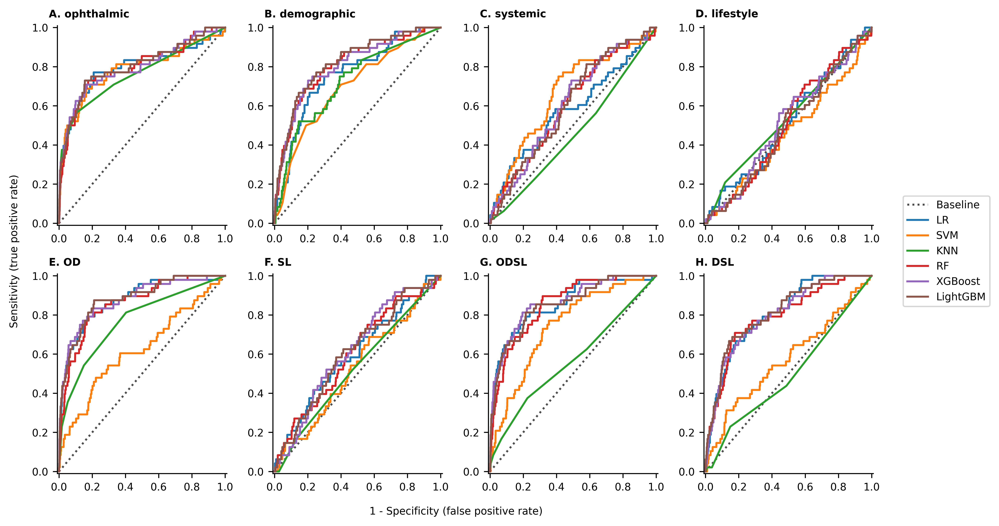

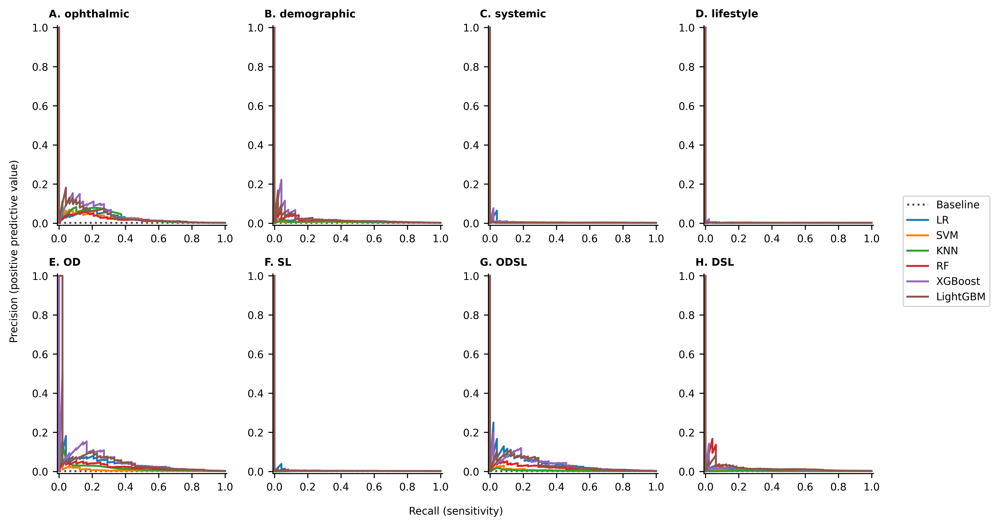

In [19]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_10year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_10year_tte,
        #y_test_10year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_10year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_10year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## matched 10 year

In [9]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_matched10year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_matched10year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_matched10year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_matched10year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_matched10year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_matched10year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_matched10year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_matched10year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_matched10year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_matched10year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: SVM (svm_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 8.209058280829814e-06 learning_rate: constant eta0: 0.03330149296234915 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.750255,0.750 (0.713 - 0.787),0.613 (0.552 - 0.674),0.813 (0.797 - 0.828),0.247 (0.213 - 0.282),0.955 (0.945 - 0.963),0.352 (0.311 - 0.392),0.336 (0.276 - 0.401)
SVM,svm_matched10year_tte,C: 1.9650847261901493e-05 kernel: rbf gamma: 6.0683243082614796e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.751325,0.751 (0.714 - 0.788),0.584 (0.523 - 0.645),0.838 (0.824 - 0.853),0.266 (0.229 - 0.303),0.953 (0.944 - 0.961),0.366 (0.322 - 0.407),0.336 (0.276 - 0.401)
KNN,knn_matched10year_tte,n_neighbors: 497 weights: distance metric: euclidean algorithm: brute,0.750698,0.751 (0.714 - 0.786),0.630 (0.569 - 0.690),0.777 (0.760 - 0.793),0.220 (0.190 - 0.250),0.954 (0.945 - 0.963),0.326 (0.287 - 0.364),0.335 (0.275 - 0.397)
RF,randomforest_matched10year_tte,n_estimators: 303 max_depth: 6 max_features: 0.6887162518572902 min_samples_leaf: 32 max_samples: 0.6856914563951229 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.748905,0.749 (0.712 - 0.785),0.564 (0.502 - 0.627),0.838 (0.824 - 0.853),0.259 (0.222 - 0.296),0.950 (0.941 - 0.960),0.355 (0.311 - 0.396),0.330 (0.271 - 0.397)
XGBoost,xgboost_matched10year_tte,n_estimators: 311 learning_rate: 0.02083899855196587 max_depth: 3 subsample: 0.5506227481308162 colsample_bytree: 0.9998569686935681 gamma: 0.00025443890330246316 lambda: 0.002221316264221719 min_child_weight: 0.0032928538169634215 max_bin: 379 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.743753,0.744 (0.706 - 0.780),0.593 (0.531 - 0.656),0.799 (0.783 - 0.815),0.228 (0.196 - 0.261),0.951 (0.942 - 0.961),0.329 (0.289 - 0.368),0.335 (0.275 - 0.402)
LightGBM,lightgbm_matched10year_tte,n_estimators: 385 max_bin: 607 learning_rate: 0.01305856640792559 max_depth: 3 num_leaves: 51 bagging_fraction: 0.8657524651179909 feature_fraction: 0.6625849050701738 lambda_l2: 0.12273234752551797 min_sum_hessian_in_leaf: 0.0010058150957487683 min_data_in_leaf: 110 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.743546,0.744 (0.706 - 0.780),0.564 (0.502 - 0.627),0.840 (0.826 - 0.855),0.261 (0.224 - 0.299),0.951 (0.941 - 0.960),0.357 (0.313 - 0.399),0.330 (0.270 - 0.397)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 4.389236111935657e-06 learning_rate: constant eta0: 0.024139593357701904 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.711709,0.712 (0.677 - 0.745),0.560 (0.498 - 0.620),0.767 (0.750 - 0.783),0.194 (0.165 - 0.223),0.946 (0.936 - 0.955),0.288 (0.250 - 0.326),0.210 (0.171 - 0.260)
SVM,svm_matched10year_tte,C: 0.00011052849673388368 kernel: poly gamma: 3.2807199743403925e-05 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.678007,0.678 (0.643 - 0.712),0.753 (0.697 - 0.806),0.495 (0.475 - 0.515),0.130 (0.112 - 0.148),0.952 (0.940 - 0.964),0.222 (0.194 - 0.248),0.182 (0.147 - 0.225)
KNN,knn_matched10year_tte,n_neighbors: 405 weights: uniform metric: manhattan algorithm: brute,0.671605,0.672 (0.634 - 0.708),0.593 (0.529 - 0.654),0.683 (0.665 - 0.702),0.158 (0.134 - 0.182),0.944 (0.933 - 0.954),0.249 (0.215 - 0.282),0.177 (0.145 - 0.217)
RF,randomforest_matched10year_tte,n_estimators: 287 max_depth: 6 max_features: 0.5543004240797728 min_samples_leaf: 155 max_samples: 0.701814372238263 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.716194,0.716 (0.681 - 0.750),0.564 (0.500 - 0.624),0.775 (0.758 - 0.792),0.201 (0.171 - 0.231),0.947 (0.936 - 0.956),0.296 (0.257 - 0.334),0.217 (0.176 - 0.266)
XGBoost,xgboost_matched10year_tte,n_estimators: 107 learning_rate: 0.0012605102856511406 max_depth: 3 subsample: 0.5071757504918875 colsample_bytree: 0.551678729535399 gamma: 0.4230836742507462 lambda: 1.240718330732481 min_child_weight: 12.761888320529893 max_bin: 128 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.719830,0.720 (0.685 - 0.753),0.650 (0.589 - 0.708),0.692 (0.674 - 0.711),0.175 (0.150 - 0.200),0.952 (0.942 - 0.961),0.275 (0.241 - 0.309),0.219 (0.178 - 0.267)
LightGBM,lightgbm_matched10year_tte,n_estimators: 310 max_bin: 877 learning_rate: 0.0030189982104484522 max_depth: 9 num_leaves: 8 bagging_fraction: 0.5660222266247623 feature_fraction: 0.7323321072610343 lambda_l2: 0.0014291011016657222 min_sum_hessian_in_leaf: 0.022166456165775148 min_data_in_leaf: 142 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.717332,0.717 (0.682 - 0.751),0.584 (0.521 - 0.645),0.755 (0.737 - 0.772),0.193 (0.165 - 0.222),0.948 (0.938 - 0.957),0.290 (0.252 - 0.327),0.220 (0.178 - 0.272)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: SVM (svm_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 0.0009885603122137857 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.536060,0.536 (0.497 - 0.575),0.185 (0.138 - 0.236),0.889 (0.876 - 0.901),0.143 (0.105 - 0.184),0.916 (0.905 - 0.927),0.162 (0.121 - 0.204),0.110 (0.091 - 0.137)
SVM,svm_matched10year_tte,C: 6.95154110437886e-05 kernel: poly gamma: 0.07777123161201423 degree: 2 random_state: 2024 cache_size: 7000 max_iter: 1000,0.565279,0.565 (0.529 - 0.602),0.535 (0.472 - 0.597),0.575 (0.555 - 0.595),0.112 (0.094 - 0.130),0.925 (0.912 - 0.938),0.185 (0.158 - 0.212),0.109 (0.092 - 0.131)
KNN,knn_matched10year_tte,n_neighbors: 293 weights: distance metric: cosine algorithm: brute,0.526851,0.527 (0.487 - 0.566),0.342 (0.284 - 0.402),0.726 (0.709 - 0.744),0.111 (0.089 - 0.134),0.917 (0.905 - 0.929),0.168 (0.137 - 0.199),0.103 (0.086 - 0.123)
RF,randomforest_matched10year_tte,n_estimators: 119 max_depth: 38 max_features: 0.028747682603761676 min_samples_leaf: 136 max_samples: 0.6124673663341985 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.549848,0.550 (0.511 - 0.588),0.346 (0.286 - 0.404),0.746 (0.729 - 0.763),0.120 (0.096 - 0.144),0.919 (0.907 - 0.931),0.178 (0.145 - 0.211),0.110 (0.091 - 0.135)
XGBoost,xgboost_matched10year_tte,n_estimators: 149 learning_rate: 0.002169231299158657 max_depth: 3 subsample: 0.9026314314837882 colsample_bytree: 0.8016696370300495 gamma: 0.12983918026519584 lambda: 0.01234314161363961 min_child_weight: 0.3661632594209 max_bin: 771 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.548143,0.548 (0.510 - 0.586),0.531 (0.469 - 0.593),0.559 (0.539 - 0.579),0.107 (0.090 - 0.125),0.922 (0.909 - 0.936),0.179 (0.152 - 0.206),0.110 (0.091 - 0.135)
LightGBM,lightgbm_matched10year_tte,n_estimators: 348 max_bin: 906 learning_rate: 0.0020898271494268917 max_depth: 3 num_leaves: 19 bagging_fraction: 0.9602877123054789 feature_fraction: 0.7099543936044207 lambda_l2: 15.55033931310875 min_sum_hessian_in_leaf: 0.0001803742158853918 min_data_in_leaf: 939 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.538825,0.539 (0.501 - 0.577),0.827 (0.778 - 0.874),0.247 (0.230 - 0.265),0.099 (0.086 - 0.112),0.935 (0.915 - 0.953),0.177 (0.156 - 0.198),0.114 (0.092 - 0.146)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 0.03217516586961407 learning_rate: constant eta0: 0.0031036356947798946 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.529394,0.529 (0.490 - 0.567),0.782 (0.729 - 0.832),0.284 (0.266 - 0.302),0.099 (0.085 - 0.112),0.929 (0.910 - 0.946),0.175 (0.153 - 0.197),0.110 (0.088 - 0.138)
SVM,svm_matched10year_tte,C: 0.0067799542941496 kernel: poly gamma: 1.7714519830995744e-05 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.529773,0.530 (0.492 - 0.566),0.617 (0.556 - 0.678),0.451 (0.431 - 0.471),0.101 (0.086 - 0.117),0.922 (0.906 - 0.936),0.174 (0.150 - 0.198),0.097 (0.082 - 0.116)
KNN,knn_matched10year_tte,n_neighbors: 473 weights: uniform metric: euclidean algorithm: brute,0.521717,0.522 (0.483 - 0.560),0.687 (0.627 - 0.745),0.358 (0.339 - 0.376),0.097 (0.083 - 0.111),0.919 (0.902 - 0.936),0.170 (0.147 - 0.192),0.106 (0.086 - 0.132)
RF,randomforest_matched10year_tte,n_estimators: 67 max_depth: 21 max_features: 0.713735090451576 min_samples_leaf: 1408 max_samples: 0.850819213615874 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.533972,0.534 (0.493 - 0.574),0.403 (0.342 - 0.465),0.690 (0.672 - 0.708),0.115 (0.095 - 0.137),0.920 (0.908 - 0.932),0.179 (0.149 - 0.210),0.109 (0.090 - 0.133)
XGBoost,xgboost_matched10year_tte,n_estimators: 156 learning_rate: 0.0014441864197604062 max_depth: 4 subsample: 0.9029588065442029 colsample_bytree: 0.8994686877401836 gamma: 0.06321985815539284 lambda: 12.03634277213133 min_child_weight: 197.08599193716782 max_bin: 675 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.531635,0.532 (0.491 - 0.570),0.461 (0.397 - 0.523),0.628 (0.609 - 0.647),0.110 (0.091 - 0.130),0.921 (0.908 - 0.934),0.178 (0.149 - 0.206),0.111 (0.090 - 0.137)
LightGBM,lightgbm_matched10year_tte,n_estimators: 461 max_bin: 546 learning_rate: 0.001002057925602424 max_depth: 8 num_leaves: 91 bagging_fraction: 0.9843431560012815 feature_fraction: 0.9893138859358304 lambda_l2: 0.14012758308430712 min_sum_hessian_in_leaf: 0.0010993734489380034 min_data_in_leaf: 2481 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.535387,0.535 (0.496 - 0.574),0.568 (0.506 - 0.630),0.507 (0.487 - 0.527),0.103 (0.087 - 0.120),0.921 (0.907 - 0.935),0.175 (0.150 - 0.200),0.188 (0.155 - 0.222)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 4.2274468751764025e-06 learning_rate: adaptive eta0: 0.07539431294266036 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.777783,0.778 (0.743 - 0.811),0.630 (0.568 - 0.690),0.813 (0.797 - 0.828),0.252 (0.218 - 0.286),0.956 (0.947 - 0.965),0.360 (0.319 - 0.400),0.366 (0.303 - 0.433)
SVM,svm_matched10year_tte,C: 0.09698289308514754 kernel: rbf gamma: 1.5611338110232762e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.676078,0.676 (0.640 - 0.711),0.576 (0.515 - 0.637),0.686 (0.667 - 0.705),0.155 (0.132 - 0.179),0.942 (0.931 - 0.952),0.245 (0.212 - 0.277),0.186 (0.150 - 0.231)
KNN,knn_matched10year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.742198,0.742 (0.707 - 0.776),0.551 (0.488 - 0.613),0.817 (0.801 - 0.832),0.231 (0.198 - 0.266),0.948 (0.938 - 0.957),0.326 (0.284 - 0.367),0.279 (0.226 - 0.340)
RF,randomforest_matched10year_tte,n_estimators: 462 max_depth: 6 max_features: 0.605081670177752 min_samples_leaf: 35 max_samples: 0.8488390547098593 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.777364,0.777 (0.743 - 0.811),0.621 (0.560 - 0.682),0.826 (0.811 - 0.841),0.264 (0.228 - 0.299),0.956 (0.947 - 0.965),0.370 (0.327 - 0.411),0.365 (0.302 - 0.433)
XGBoost,xgboost_matched10year_tte,n_estimators: 480 learning_rate: 0.013240427100479664 max_depth: 3 subsample: 0.8864248895924715 colsample_bytree: 0.6559147755702529 gamma: 0.00011661958922492734 lambda: 8.36675114847505 min_child_weight: 0.13938240386137343 max_bin: 379 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.779257,0.779 (0.744 - 0.813),0.621 (0.560 - 0.682),0.825 (0.810 - 0.840),0.262 (0.227 - 0.297),0.956 (0.947 - 0.965),0.369 (0.326 - 0.409),0.381 (0.315 - 0.447)
LightGBM,lightgbm_matched10year_tte,n_estimators: 482 max_bin: 846 learning_rate: 0.014068503881340146 max_depth: 3 num_leaves: 49 bagging_fraction: 0.9461609803260992 feature_fraction: 0.9918463566222979 lambda_l2: 0.004944173986186318 min_sum_hessian_in_leaf: 0.0005400944442160348 min_data_in_leaf: 35 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.776926,0.777 (0.742 - 0.810),0.601 (0.539 - 0.662),0.836 (0.821 - 0.850),0.268 (0.232 - 0.305),0.954 (0.945 - 0.963),0.371 (0.328 - 0.412),0.376 (0.311 - 0.442)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 0.0040954066907529845 learning_rate: adaptive eta0: 0.033272783435607446 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.542652,0.543 (0.504 - 0.581),0.333 (0.273 - 0.393),0.754 (0.736 - 0.770),0.119 (0.095 - 0.144),0.919 (0.906 - 0.931),0.176 (0.143 - 0.209),0.113 (0.091 - 0.140)
SVM,svm_matched10year_tte,C: 1.505116112757572e-06 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.540747,0.541 (0.502 - 0.580),0.465 (0.403 - 0.528),0.610 (0.591 - 0.630),0.107 (0.088 - 0.126),0.919 (0.906 - 0.933),0.174 (0.146 - 0.202),0.103 (0.087 - 0.123)
KNN,knn_matched10year_tte,n_neighbors: 405 weights: uniform metric: euclidean algorithm: brute,0.505846,0.506 (0.467 - 0.545),0.288 (0.231 - 0.346),0.739 (0.722 - 0.757),0.100 (0.078 - 0.123),0.912 (0.900 - 0.924),0.148 (0.118 - 0.179),0.096 (0.080 - 0.117)
RF,randomforest_matched10year_tte,n_estimators: 421 max_depth: 34 max_features: 0.03008210230596237 min_samples_leaf: 522 max_samples: 0.9598777965913605 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.557410,0.557 (0.518 - 0.596),0.329 (0.271 - 0.389),0.768 (0.751 - 0.784),0.124 (0.099 - 0.150),0.920 (0.908 - 0.931),0.180 (0.146 - 0.214),0.116 (0.095 - 0.142)
XGBoost,xgboost_matched10year_tte,n_estimators: 104 learning_rate: 0.010620472446373628 max_depth: 9 subsample: 0.7961039960916583 colsample_bytree: 0.6606401107867672 gamma: 0.03817497376197228 lambda: 29.746160684699277 min_child_weight: 0.007305180184434469 max_bin: 627 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.557486,0.557 (0.518 - 0.596),0.416 (0.355 - 0.478),0.692 (0.673 - 0.710),0.119 (0.097 - 0.141),0.922 (0.910 - 0.934),0.185 (0.154 - 0.216),0.126 (0.099 - 0.159)
LightGBM,lightgbm_matched10year_tte,n_estimators: 396 max_bin: 269 learning_rate: 0.0026496623308563567 max_depth: 9 num_leaves: 40 bagging_fraction: 0.9743677026350146 feature_fraction: 0.8878447189595772 lambda_l2: 0.01634085609578187 min_sum_hessian_in_leaf: 0.0009514488217276054 min_data_in_leaf: 1151 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.547683,0.548 (0.508 - 0.586),0.514 (0.451 - 0.576),0.580 (0.561 - 0.600),0.109 (0.092 - 0.128),0.923 (0.909 - 0.936),0.180 (0.153 - 0.207),0.112 (0.092 - 0.139)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 1.4695098958628518e-06 learning_rate: adaptive eta0: 0.07395188086978588 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.782444,0.782 (0.749 - 0.815),0.733 (0.676 - 0.787),0.725 (0.707 - 0.743),0.211 (0.184 - 0.238),0.964 (0.956 - 0.973),0.327 (0.291 - 0.362),0.348 (0.286 - 0.413)
SVM,svm_matched10year_tte,C: 0.0005624041347635842 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.725964,0.726 (0.690 - 0.762),0.630 (0.569 - 0.689),0.715 (0.697 - 0.733),0.181 (0.155 - 0.208),0.951 (0.940 - 0.960),0.281 (0.246 - 0.316),0.288 (0.232 - 0.349)
KNN,knn_matched10year_tte,n_neighbors: 401 weights: distance metric: manhattan algorithm: brute,0.650604,0.651 (0.614 - 0.687),0.556 (0.493 - 0.617),0.705 (0.687 - 0.723),0.159 (0.135 - 0.184),0.941 (0.930 - 0.951),0.247 (0.214 - 0.281),0.164 (0.132 - 0.203)
RF,randomforest_matched10year_tte,n_estimators: 353 max_depth: 26 max_features: 0.2861071599108328 min_samples_leaf: 26 max_samples: 0.9896982163867328 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.783513,0.784 (0.750 - 0.816),0.605 (0.542 - 0.665),0.835 (0.820 - 0.849),0.268 (0.232 - 0.305),0.955 (0.946 - 0.963),0.372 (0.329 - 0.413),0.379 (0.315 - 0.447)
XGBoost,xgboost_matched10year_tte,n_estimators: 281 learning_rate: 0.015832712839793494 max_depth: 5 subsample: 0.530916702274733 colsample_bytree: 0.8865174488037676 gamma: 0.0013535508584357672 lambda: 11.811568517148084 min_child_weight: 0.3055913825193837 max_bin: 430 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.786207,0.786 (0.753 - 0.819),0.737 (0.681 - 0.791),0.714 (0.696 - 0.732),0.205 (0.178 - 0.232),0.964 (0.956 - 0.973),0.321 (0.284 - 0.355),0.364 (0.302 - 0.431)
LightGBM,lightgbm_matched10year_tte,n_estimators: 356 max_bin: 278 learning_rate: 0.029850839437535324 max_depth: 3 num_leaves: 83 bagging_fraction: 0.5882598879197698 feature_fraction: 0.7222471810698609 lambda_l2: 11.104096167833008 min_sum_hessian_in_leaf: 0.345367177527809 min_data_in_leaf: 16 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.784437,0.784 (0.751 - 0.817),0.708 (0.649 - 0.764),0.745 (0.728 - 0.762),0.217 (0.189 - 0.246),0.962 (0.953 - 0.971),0.333 (0.295 - 0.369),0.382 (0.316 - 0.449)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched10year_tte,alpha: 1.7006903907979017e-05 learning_rate: adaptive eta0: 0.09430022042558132 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.708754,0.709 (0.675 - 0.742),0.539 (0.477 - 0.602),0.770 (0.752 - 0.786),0.190 (0.161 - 0.220),0.943 (0.933 - 0.953),0.281 (0.243 - 0.319),0.191 (0.159 - 0.233)
SVM,svm_matched10year_tte,C: 0.010139466182029946 kernel: rbf gamma: 0.012826421209438162 random_state: 2024 cache_size: 7000 max_iter: 1000,0.624598,0.625 (0.591 - 0.659),0.667 (0.607 - 0.725),0.555 (0.535 - 0.575),0.130 (0.112 - 0.149),0.943 (0.931 - 0.955),0.218 (0.190 - 0.245),0.130 (0.108 - 0.159)
KNN,knn_matched10year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.601057,0.601 (0.564 - 0.639),0.708 (0.651 - 0.764),0.454 (0.434 - 0.474),0.115 (0.099 - 0.131),0.939 (0.925 - 0.953),0.198 (0.172 - 0.223),0.136 (0.111 - 0.167)
RF,randomforest_matched10year_tte,n_estimators: 179 max_depth: 43 max_features: 0.6986984558663356 min_samples_leaf: 176 max_samples: 0.9318840737961411 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.713444,0.713 (0.679 - 0.748),0.535 (0.472 - 0.597),0.800 (0.784 - 0.816),0.211 (0.179 - 0.244),0.945 (0.935 - 0.955),0.303 (0.262 - 0.342),0.217 (0.175 - 0.266)
XGBoost,xgboost_matched10year_tte,n_estimators: 254 learning_rate: 0.0031091557759235734 max_depth: 4 subsample: 0.7801866610871535 colsample_bytree: 0.8197573668688691 gamma: 0.004885568334141776 lambda: 0.02289996872961793 min_child_weight: 0.08338052188200003 max_bin: 143 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.717252,0.717 (0.683 - 0.751),0.638 (0.577 - 0.697),0.695 (0.677 - 0.714),0.173 (0.149 - 0.199),0.950 (0.940 - 0.960),0.273 (0.238 - 0.306),0.223 (0.180 - 0.273)
LightGBM,lightgbm_matched10year_tte,n_estimators: 155 max_bin: 592 learning_rate: 0.001817986558412681 max_depth: 3 num_leaves: 19 bagging_fraction: 0.6241814370906226 feature_fraction: 0.7756319097959452 lambda_l2: 0.07728211364285936 min_sum_hessian_in_leaf: 0.00014669871548180356 min_data_in_leaf: 245 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.710465,0.710 (0.676 - 0.744),0.646 (0.586 - 0.704),0.674 (0.656 - 0.693),0.166 (0.143 - 0.190),0.950 (0.940 - 0.960),0.264 (0.231 - 0.297),0.212 (0.173 - 0.262)


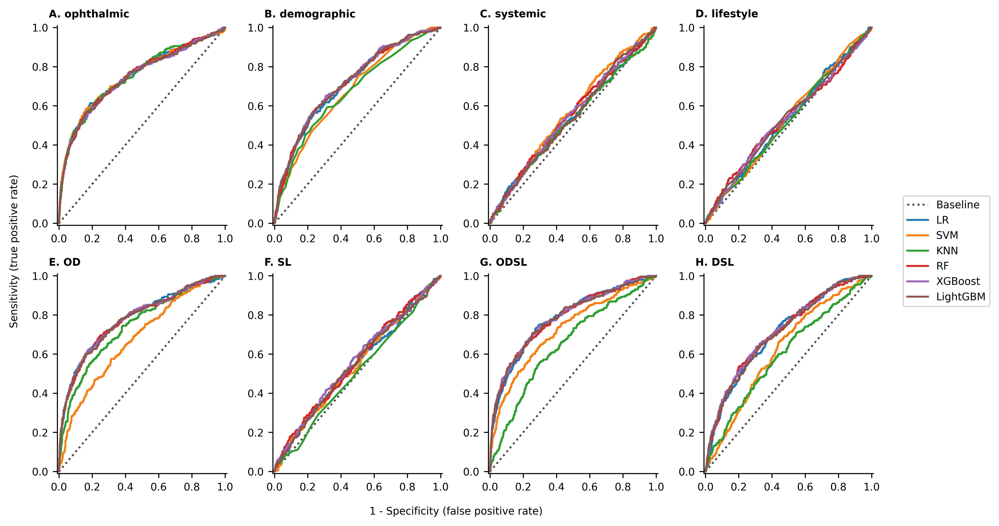

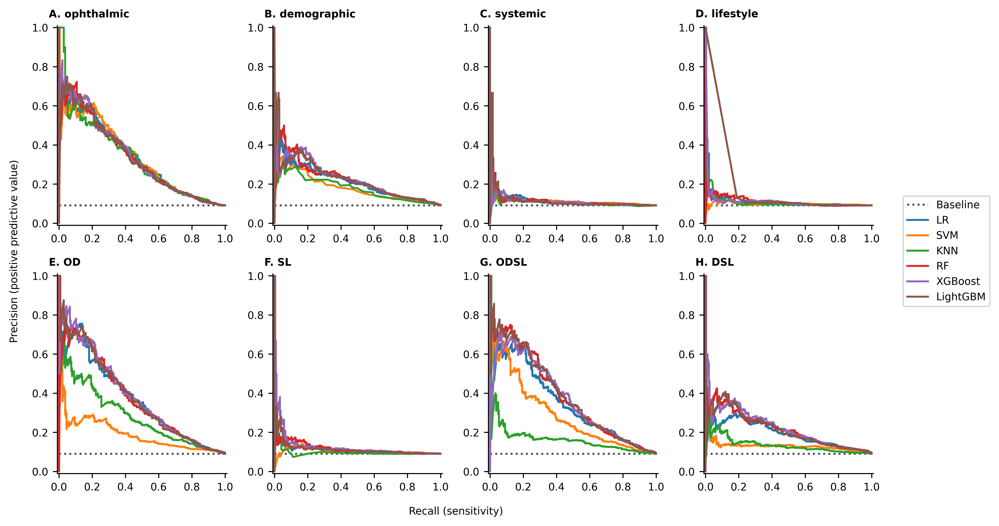

In [10]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_matched10year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_matched10year_tte,
        #y_test_matched10year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_matched10year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_matched10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_matched10year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_matched10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_matched10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

In [ ]:
# V2

comparison_dict = {}
 
for feature_set_name, features in compare_feature_set_dict.items():    
    with open(f'./evaluation/{feature_set_name}/best_algorithm_matched10year_tte.txt', 'r') as txt:
        best_algorithm = txt.read()

    print(f'{feature_set_name} --> {best_algorithm}')
    
    comparison_dict[feature_set_name] = {
        'feature_set': feature_set_name,
        'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{best_algorithm}',
        'algorithm': best_algorithm,
    }

fig, axes = plt.subplots(1, 2, figsize=(14/2.54, 8/2.54), dpi=600, sharex=False, sharey=False)
#auroc_bar_ax = axes[0, 0]
roc_ax = axes[0]
prc_ax = axes[1]


compare_models(
    comparison_dict, 
    f'./evaluation/compare_feature_sets',
    #auroc_bar_ax=auroc_bar_ax, 
    roc_ax=roc_ax, 
    prc_ax=prc_ax,
)

    
auroc_bar_ax.text(-0.1, 1.1, f'A.', transform=auroc_bar_ax.transAxes, fontsize=10, fontweight='bold', va='top', ha='right')
roc_ax.text(-0.1, 1.1, f'A.', transform=roc_ax.transAxes, fontsize=10, fontweight='bold', va='top', ha='right')
prc_ax.text(-0.1, 1.1, f'B.', transform=prc_ax.transAxes, fontsize=10, fontweight='bold', va='top', ha='right')

# bar_ax.set_xlabel('Algorithm', fontsize=8)
# bar_ax.set_ylabel('Area under the receiver operating characteristic curve (AUROC)', fontsize=8)
# bar_ax.tick_params(axis='x', labelsize=8)
# bar_ax.tick_params(axis='y', labelsize=8)

auroc_bar_ax.set_xlabel('Feature set', fontsize=8)
auroc_bar_ax.set_ylabel('AUROC', fontsize=8)
auroc_bar_ax.tick_params(axis='x', labelsize=8)
auroc_bar_ax.tick_params(axis='y', labelsize=8)
auroc_bar_ax.spines['top'].set_visible(False)
auroc_bar_ax.spines['right'].set_visible(False)

roc_ax.set_xlabel('1 - Specificity (false positive rate)', fontsize=8)
roc_ax.set_ylabel('Sensitivity (true positive rate)', fontsize=8)
roc_ax.tick_params(axis='x', labelsize=8)
roc_ax.tick_params(axis='y', labelsize=8)
roc_ax.set_xticks(np.linspace(0, 1, 6))
roc_ax.set_yticks(np.linspace(0, 1, 6))
roc_ax.spines['top'].set_visible(False)
roc_ax.spines['right'].set_visible(False)

prc_ax.set_xlabel('Recall (sensitivity)', fontsize=8)
prc_ax.set_ylabel('Precision (positive predictive value)', fontsize=8)
prc_ax.tick_params(axis='x', labelsize=8)
prc_ax.tick_params(axis='y', labelsize=8)
prc_ax.set_xticks(np.linspace(0, 1, 6))
prc_ax.set_yticks(np.linspace(0, 1, 6))
prc_ax.spines['top'].set_visible(False)
prc_ax.spines['right'].set_visible(False)

labels=['Baseline'] + list(compare_feature_set_dict.keys()) 
#fig.legend(loc='center', bbox_to_anchor=(0.5, 0, 0.5, 0.5), fontsize=8, labels=labels, handles=roc_ax.lines)
fig.legend(loc='center', bbox_to_anchor=(1.05, 0, 0.1, 1), fontsize=8, labels=labels, handles=roc_ax.lines)

fig.tight_layout()

fig.savefig(f'./evaluation/compare_feature_sets_roc_prc_matched10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
fig.show()

<br>

## IOP removed 10 year tte

In [8]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_IOPremoved10year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_IOPremoved10year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_IOPremoved10year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_IOPremoved10year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_IOPremoved10year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_IOPremoved10year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_IOPremoved10year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_IOPremoved10year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_IOPremoved10year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_IOPremoved10year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

demographic
LR
SVM
KNN
RF
XGBoost


/home/eake191/.pyenv/versions/3.13.2/lib/python3.13/site-packages/xgboost/core.py:158: UserWarning: [08:26:17] WARNING: /workspace/src/collective/../data/../common/error_msg.h:80: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  warnings.warn(smsg, UserWarning)


LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 4.330589902958385e-06 learning_rate: adaptive eta0: 0.008568683872021112 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.738843,0.739 (0.725 - 0.752),0.705 (0.679 - 0.731),0.647 (0.644 - 0.650),0.023 (0.022 - 0.025),0.995 (0.994 - 0.995),0.045 (0.042 - 0.048),0.038 (0.033 - 0.044)
SVM,svm_IOPremoved10year_tte,C: 0.0009317777549096 kernel: rbf gamma: 1.4852290768078621e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.655579,0.656 (0.641 - 0.670),0.683 (0.656 - 0.709),0.561 (0.558 - 0.565),0.018 (0.017 - 0.020),0.993 (0.993 - 0.994),0.036 (0.033 - 0.038),0.019 (0.018 - 0.021)
KNN,knn_IOPremoved10year_tte,n_neighbors: 497 weights: uniform metric: euclidean algorithm: brute,0.711804,0.712 (0.696 - 0.727),0.618 (0.590 - 0.645),0.687 (0.684 - 0.690),0.023 (0.021 - 0.025),0.993 (0.993 - 0.994),0.045 (0.041 - 0.048),0.033 (0.029 - 0.039)
RF,randomforest_IOPremoved10year_tte,n_estimators: 294 max_depth: 34 max_features: 0.4094544172205433 min_samples_leaf: 831 max_samples: 0.5589816327267189 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.734570,0.735 (0.720 - 0.748),0.727 (0.701 - 0.751),0.621 (0.618 - 0.624),0.022 (0.021 - 0.024),0.995 (0.994 - 0.995),0.044 (0.041 - 0.046),0.037 (0.032 - 0.042)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 484 learning_rate: 0.014330117015135129 max_depth: 3 subsample: 0.90919554764497 colsample_bytree: 0.6337683988715446 gamma: 0.03171361501731889 lambda: 0.41532201693180804 min_child_weight: 0.0017065350164930345 max_bin: 457 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.738328,0.738 (0.724 - 0.752),0.754 (0.729 - 0.778),0.595 (0.592 - 0.598),0.022 (0.020 - 0.023),0.995 (0.995 - 0.996),0.042 (0.040 - 0.045),0.038 (0.033 - 0.044)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 353 max_bin: 282 learning_rate: 0.025091925456151874 max_depth: 3 num_leaves: 72 bagging_fraction: 0.6238095696434602 feature_fraction: 0.902131182973354 lambda_l2: 39.92112745791604 min_sum_hessian_in_leaf: 0.0002456322799203492 min_data_in_leaf: 2133 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.737900,0.738 (0.724 - 0.751),0.747 (0.722 - 0.772),0.602 (0.599 - 0.605),0.022 (0.021 - 0.023),0.995 (0.994 - 0.996),0.043 (0.040 - 0.046),0.039 (0.034 - 0.046)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 1.0530788061432724e-06 learning_rate: adaptive eta0: 0.08984054820743442 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.623818,0.624 (0.608 - 0.639),0.670 (0.643 - 0.697),0.528 (0.525 - 0.531),0.017 (0.016 - 0.018),0.993 (0.992 - 0.993),0.033 (0.030 - 0.035),0.018 (0.016 - 0.019)
SVM,svm_IOPremoved10year_tte,C: 0.04602414864625135 kernel: rbf gamma: 3.0961452709746053 random_state: 2024 cache_size: 7000 max_iter: 1000,0.545255,0.545 (0.530 - 0.561),0.655 (0.628 - 0.683),0.461 (0.458 - 0.464),0.014 (0.013 - 0.015),0.991 (0.990 - 0.992),0.028 (0.026 - 0.030),0.013 (0.012 - 0.015)
KNN,knn_IOPremoved10year_tte,n_neighbors: 477 weights: distance metric: manhattan algorithm: brute,0.571069,0.571 (0.555 - 0.587),0.545 (0.516 - 0.574),0.568 (0.565 - 0.572),0.015 (0.014 - 0.016),0.990 (0.990 - 0.991),0.029 (0.027 - 0.031),0.015 (0.013 - 0.016)
RF,randomforest_IOPremoved10year_tte,n_estimators: 366 max_depth: 22 max_features: 0.0875427005240042 min_samples_leaf: 166 max_samples: 0.7760991672793098 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.633630,0.634 (0.619 - 0.648),0.706 (0.679 - 0.732),0.503 (0.500 - 0.506),0.017 (0.016 - 0.018),0.993 (0.992 - 0.994),0.033 (0.031 - 0.035),0.018 (0.016 - 0.020)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 491 learning_rate: 0.013252371135659007 max_depth: 4 subsample: 0.5713291793032342 colsample_bytree: 0.8442571110526735 gamma: 0.9647928205120369 lambda: 0.0013294711993611147 min_child_weight: 3.2534703587026836 max_bin: 208 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.636006,0.636 (0.621 - 0.651),0.627 (0.600 - 0.654),0.574 (0.571 - 0.577),0.017 (0.016 - 0.019),0.992 (0.992 - 0.993),0.034 (0.031 - 0.036),0.018 (0.017 - 0.020)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 441 max_bin: 628 learning_rate: 0.017651024679953217 max_depth: 7 num_leaves: 12 bagging_fraction: 0.5424271679976245 feature_fraction: 0.9919787302202274 lambda_l2: 0.3250558052201331 min_sum_hessian_in_leaf: 0.04891415462798276 min_data_in_leaf: 814 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.631855,0.632 (0.617 - 0.647),0.665 (0.638 - 0.692),0.538 (0.535 - 0.542),0.017 (0.016 - 0.018),0.993 (0.992 - 0.993),0.033 (0.031 - 0.035),0.018 (0.017 - 0.020)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 1.5887720987105797e-06 learning_rate: adaptive eta0: 0.08050207559605725 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.551663,0.552 (0.536 - 0.568),0.680 (0.653 - 0.706),0.408 (0.405 - 0.411),0.014 (0.013 - 0.014),0.991 (0.990 - 0.992),0.027 (0.025 - 0.028),0.014 (0.013 - 0.015)
SVM,svm_IOPremoved10year_tte,C: 0.06461203005640213 kernel: rbf gamma: 1.8242224780725025 random_state: 2024 cache_size: 7000 max_iter: 1000,0.503910,0.504 (0.487 - 0.520),0.595 (0.565 - 0.622),0.428 (0.425 - 0.431),0.012 (0.011 - 0.013),0.989 (0.988 - 0.990),0.024 (0.022 - 0.026),0.012 (0.011 - 0.013)
KNN,knn_IOPremoved10year_tte,n_neighbors: 461 weights: uniform metric: cosine algorithm: brute,0.510635,0.511 (0.494 - 0.527),0.320 (0.294 - 0.347),0.703 (0.700 - 0.706),0.013 (0.012 - 0.014),0.989 (0.988 - 0.989),0.025 (0.022 - 0.027),0.012 (0.011 - 0.013)
RF,randomforest_IOPremoved10year_tte,n_estimators: 393 max_depth: 19 max_features: 0.05451666331268983 min_samples_leaf: 2687 max_samples: 0.7218266671678598 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.560190,0.560 (0.544 - 0.576),0.713 (0.687 - 0.739),0.384 (0.381 - 0.387),0.014 (0.013 - 0.015),0.991 (0.990 - 0.992),0.027 (0.025 - 0.029),0.014 (0.013 - 0.016)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 450 learning_rate: 0.03022982150114569 max_depth: 9 subsample: 0.5535536740599951 colsample_bytree: 0.9670616156299666 gamma: 0.360618831100572 lambda: 850.97128021956 min_child_weight: 0.41690163001714475 max_bin: 897 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.554564,0.555 (0.539 - 0.571),0.577 (0.549 - 0.606),0.522 (0.518 - 0.525),0.014 (0.013 - 0.015),0.990 (0.990 - 0.991),0.028 (0.026 - 0.030),0.014 (0.013 - 0.016)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 122 max_bin: 702 learning_rate: 0.08481590499292821 max_depth: 8 num_leaves: 15 bagging_fraction: 0.5347731352980112 feature_fraction: 0.8139103570275039 lambda_l2: 747.3582661144736 min_sum_hessian_in_leaf: 1.484400561277518 min_data_in_leaf: 301 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.554885,0.555 (0.539 - 0.571),0.661 (0.634 - 0.688),0.428 (0.425 - 0.431),0.014 (0.013 - 0.015),0.991 (0.990 - 0.992),0.027 (0.025 - 0.029),0.014 (0.013 - 0.017)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 1.3946276504170143e-06 learning_rate: adaptive eta0: 0.08926561161618986 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.623310,0.623 (0.608 - 0.638),0.649 (0.621 - 0.676),0.545 (0.542 - 0.548),0.017 (0.016 - 0.018),0.992 (0.992 - 0.993),0.033 (0.030 - 0.035),0.018 (0.016 - 0.020)
SVM,svm_IOPremoved10year_tte,C: 2.9165184047096232e-06 kernel: rbf gamma: 0.931289644717368 random_state: 2024 cache_size: 7000 max_iter: 1000,0.572752,0.573 (0.556 - 0.589),0.562 (0.533 - 0.591),0.568 (0.565 - 0.571),0.015 (0.014 - 0.017),0.991 (0.990 - 0.992),0.030 (0.028 - 0.032),0.014 (0.013 - 0.016)
KNN,knn_IOPremoved10year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.545311,0.545 (0.529 - 0.562),0.491 (0.463 - 0.520),0.583 (0.580 - 0.586),0.014 (0.013 - 0.015),0.990 (0.989 - 0.990),0.027 (0.025 - 0.029),0.014 (0.013 - 0.016)
RF,randomforest_IOPremoved10year_tte,n_estimators: 440 max_depth: 27 max_features: 0.11031868409793623 min_samples_leaf: 398 max_samples: 0.6328424264772793 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.636346,0.636 (0.621 - 0.651),0.714 (0.688 - 0.740),0.505 (0.502 - 0.508),0.017 (0.016 - 0.018),0.993 (0.993 - 0.994),0.033 (0.031 - 0.035),0.018 (0.017 - 0.020)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 350 learning_rate: 0.029324195036397056 max_depth: 3 subsample: 0.5349856609127929 colsample_bytree: 0.7386391214543233 gamma: 0.0018455625852935216 lambda: 0.0024176461938225087 min_child_weight: 0.0002575406647345257 max_bin: 500 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.634391,0.634 (0.619 - 0.649),0.668 (0.640 - 0.694),0.544 (0.541 - 0.547),0.017 (0.016 - 0.018),0.993 (0.992 - 0.993),0.034 (0.031 - 0.036),0.019 (0.017 - 0.021)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 449 max_bin: 636 learning_rate: 0.014131797377755436 max_depth: 7 num_leaves: 13 bagging_fraction: 0.6302302670976618 feature_fraction: 0.5825021414866215 lambda_l2: 0.5522546504666396 min_sum_hessian_in_leaf: 0.0001346194193599946 min_data_in_leaf: 360 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.637388,0.637 (0.622 - 0.652),0.595 (0.567 - 0.624),0.624 (0.621 - 0.627),0.019 (0.017 - 0.020),0.992 (0.992 - 0.993),0.036 (0.034 - 0.039),0.019 (0.017 - 0.021)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 6.974998034598298e-06 learning_rate: adaptive eta0: 0.09979491506116396 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.741166,0.741 (0.727 - 0.754),0.678 (0.651 - 0.704),0.677 (0.674 - 0.680),0.025 (0.023 - 0.026),0.994 (0.994 - 0.995),0.047 (0.044 - 0.051),0.037 (0.033 - 0.042)
SVM,svm_IOPremoved10year_tte,C: 5.153777250624887e-05 kernel: rbf gamma: 0.39124754374748094 random_state: 2024 cache_size: 7000 max_iter: 1000,0.601403,0.601 (0.586 - 0.617),0.634 (0.607 - 0.662),0.535 (0.532 - 0.538),0.016 (0.015 - 0.017),0.992 (0.991 - 0.993),0.031 (0.029 - 0.034),0.016 (0.015 - 0.017)
KNN,knn_IOPremoved10year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.615017,0.615 (0.599 - 0.631),0.722 (0.696 - 0.747),0.454 (0.451 - 0.457),0.016 (0.015 - 0.017),0.993 (0.992 - 0.993),0.031 (0.028 - 0.033),0.019 (0.016 - 0.022)
RF,randomforest_IOPremoved10year_tte,n_estimators: 432 max_depth: 9 max_features: 0.4763970612862473 min_samples_leaf: 197 max_samples: 0.6089483332973741 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.738538,0.739 (0.725 - 0.752),0.669 (0.642 - 0.695),0.684 (0.681 - 0.687),0.025 (0.023 - 0.026),0.994 (0.994 - 0.995),0.048 (0.045 - 0.051),0.038 (0.033 - 0.044)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 401 learning_rate: 0.020538533469961262 max_depth: 3 subsample: 0.7184972272613517 colsample_bytree: 0.9145021374358996 gamma: 0.005517055958558666 lambda: 1.5637990071680394 min_child_weight: 0.1009327373734039 max_bin: 964 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.740407,0.740 (0.727 - 0.754),0.655 (0.628 - 0.682),0.700 (0.697 - 0.703),0.026 (0.024 - 0.027),0.994 (0.994 - 0.995),0.049 (0.046 - 0.052),0.038 (0.034 - 0.044)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 369 max_bin: 892 learning_rate: 0.024719266551576552 max_depth: 3 num_leaves: 112 bagging_fraction: 0.5620021623090331 feature_fraction: 0.622877399718728 lambda_l2: 8.828941185066016 min_sum_hessian_in_leaf: 0.004022243382521452 min_data_in_leaf: 204 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.741335,0.741 (0.728 - 0.755),0.731 (0.706 - 0.756),0.623 (0.620 - 0.626),0.023 (0.021 - 0.024),0.995 (0.994 - 0.995),0.044 (0.041 - 0.047),0.039 (0.034 - 0.044)


DS
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 7.508074382868441e-06 learning_rate: adaptive eta0: 0.07179634195899669 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.741301,0.741 (0.727 - 0.755),0.674 (0.646 - 0.699),0.677 (0.674 - 0.680),0.024 (0.023 - 0.026),0.994 (0.994 - 0.995),0.047 (0.044 - 0.050),0.037 (0.033 - 0.042)
SVM,svm_IOPremoved10year_tte,C: 2.2212289301955894 kernel: rbf gamma: 1.644330550188879 random_state: 2024 cache_size: 7000 max_iter: 1000,0.586083,0.586 (0.570 - 0.602),0.549 (0.520 - 0.578),0.597 (0.594 - 0.600),0.016 (0.015 - 0.017),0.991 (0.990 - 0.992),0.031 (0.029 - 0.034),0.015 (0.014 - 0.016)
KNN,knn_IOPremoved10year_tte,n_neighbors: 499 weights: uniform metric: manhattan algorithm: brute,0.653489,0.653 (0.638 - 0.668),0.633 (0.605 - 0.661),0.591 (0.588 - 0.594),0.018 (0.017 - 0.020),0.993 (0.992 - 0.993),0.035 (0.033 - 0.038),0.021 (0.019 - 0.024)
RF,randomforest_IOPremoved10year_tte,n_estimators: 153 max_depth: 28 max_features: 0.46383913895153106 min_samples_leaf: 945 max_samples: 0.7306576310526635 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.736720,0.737 (0.723 - 0.750),0.740 (0.715 - 0.764),0.612 (0.609 - 0.616),0.022 (0.021 - 0.024),0.995 (0.994 - 0.995),0.043 (0.041 - 0.046),0.037 (0.033 - 0.042)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 500 learning_rate: 0.013988489814622541 max_depth: 4 subsample: 0.8864452441127694 colsample_bytree: 0.7670289807103938 gamma: 0.1556664414136378 lambda: 1.6100601904310603 min_child_weight: 1.4218232099317663 max_bin: 714 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.740293,0.740 (0.726 - 0.754),0.641 (0.613 - 0.668),0.708 (0.705 - 0.711),0.026 (0.024 - 0.027),0.994 (0.993 - 0.995),0.049 (0.046 - 0.053),0.039 (0.034 - 0.045)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 379 max_bin: 288 learning_rate: 0.014567767206213923 max_depth: 4 num_leaves: 61 bagging_fraction: 0.5801433193433048 feature_fraction: 0.9292245695908279 lambda_l2: 0.022090843505582793 min_sum_hessian_in_leaf: 5.440069199220514 min_data_in_leaf: 323 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.740180,0.740 (0.726 - 0.753),0.674 (0.646 - 0.699),0.679 (0.676 - 0.681),0.024 (0.023 - 0.026),0.994 (0.994 - 0.995),0.047 (0.044 - 0.050),0.038 (0.034 - 0.044)


DL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_IOPremoved10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved10year_tte,alpha: 6.151396077574852e-06 learning_rate: adaptive eta0: 0.044241826075421826 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.739358,0.739 (0.725 - 0.753),0.648 (0.620 - 0.674),0.714 (0.711 - 0.716),0.026 (0.025 - 0.028),0.994 (0.994 - 0.995),0.051 (0.047 - 0.054),0.038 (0.033 - 0.043)
SVM,svm_IOPremoved10year_tte,C: 0.26985279462400097 kernel: rbf gamma: 1.4109542316434271 random_state: 2024 cache_size: 7000 max_iter: 1000,0.564357,0.564 (0.547 - 0.581),0.345 (0.317 - 0.372),0.756 (0.753 - 0.759),0.017 (0.015 - 0.018),0.990 (0.989 - 0.990),0.032 (0.029 - 0.035),0.015 (0.013 - 0.016)
KNN,knn_IOPremoved10year_tte,n_neighbors: 497 weights: distance metric: manhattan algorithm: brute,0.627950,0.628 (0.612 - 0.643),0.703 (0.676 - 0.729),0.492 (0.489 - 0.495),0.016 (0.015 - 0.017),0.993 (0.992 - 0.994),0.032 (0.030 - 0.034),0.019 (0.017 - 0.022)
RF,randomforest_IOPremoved10year_tte,n_estimators: 298 max_depth: 44 max_features: 0.4660293318449379 min_samples_leaf: 950 max_samples: 0.5855629084535671 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.736060,0.736 (0.722 - 0.750),0.662 (0.635 - 0.689),0.689 (0.686 - 0.692),0.025 (0.023 - 0.027),0.994 (0.994 - 0.995),0.048 (0.045 - 0.051),0.037 (0.033 - 0.042)
XGBoost,xgboost_IOPremoved10year_tte,n_estimators: 304 learning_rate: 0.0281440304042278 max_depth: 3 subsample: 0.7777691025784281 colsample_bytree: 0.6209113031969152 gamma: 0.00519081075167224 lambda: 23.43230738901167 min_child_weight: 0.055382093033477374 max_bin: 364 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.739936,0.740 (0.726 - 0.753),0.702 (0.675 - 0.727),0.652 (0.648 - 0.655),0.024 (0.022 - 0.025),0.995 (0.994 - 0.995),0.046 (0.043 - 0.049),0.038 (0.033 - 0.044)
LightGBM,lightgbm_IOPremoved10year_tte,n_estimators: 386 max_bin: 915 learning_rate: 0.019319772964705478 max_depth: 3 num_leaves: 81 bagging_fraction: 0.7407045890820643 feature_fraction: 0.7111684679866604 lambda_l2: 2.5786251397671704 min_sum_hessian_in_leaf: 0.00033431099892696625 min_data_in_leaf: 4964 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.740387,0.740 (0.727 - 0.754),0.680 (0.652 - 0.705),0.676 (0.673 - 0.679),0.024 (0.023 - 0.026),0.994 (0.994 - 0.995),0.047 (0.044 - 0.050),0.038 (0.033 - 0.044)


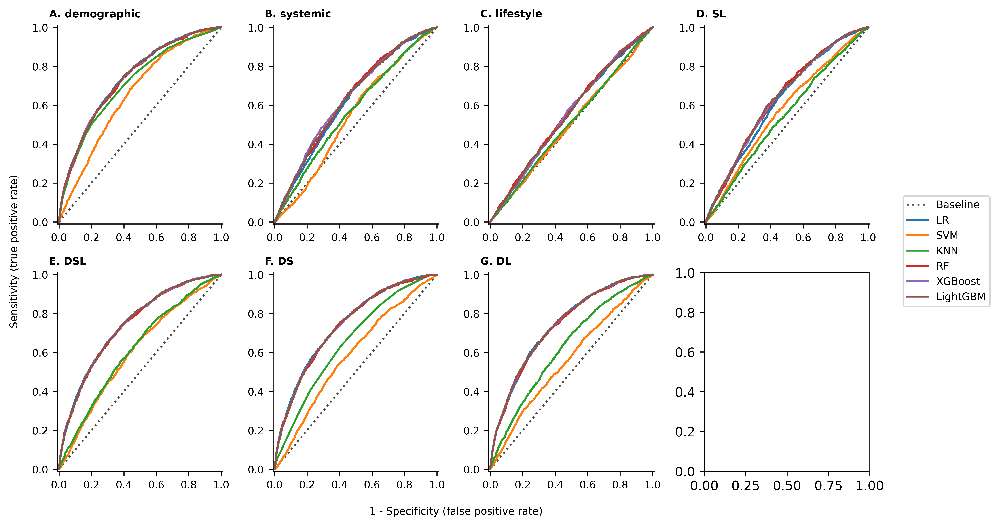

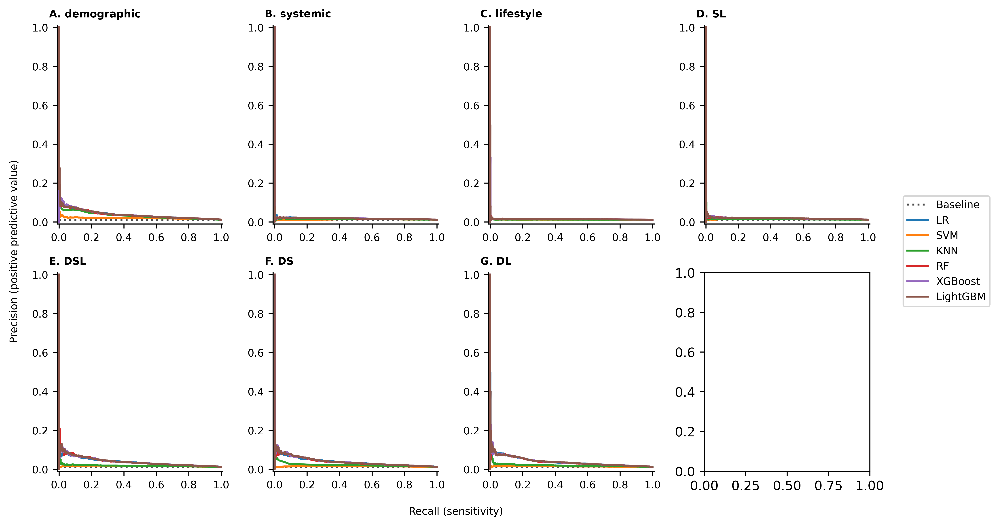

In [9]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_IOPremoved10year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_IOPremoved10year_tte,
        #y_test_IOPremoved10year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_IOPremoved10year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_IOPremoved10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_IOPremoved10year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_IOPremoved10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_IOPremoved10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

## 10 years RNFL

In [32]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_10year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_10year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_10year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_10year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_10year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_10year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_10year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_rnfl10year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_rnfl10year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_rnfl10year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 1.0541430214259856e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.767258,0.767 (0.731 - 0.802),0.621 (0.558 - 0.682),0.829 (0.824 - 0.834),0.039 (0.033 - 0.045),0.995 (0.994 - 0.996),0.074 (0.063 - 0.085),0.080 (0.059 - 0.110)
SVM,svm_rnfl10year_tte,C: 3.0298344332807936e-06 kernel: rbf gamma: 1.0494562955797776e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.770553,0.771 (0.734 - 0.805),0.724 (0.667 - 0.780),0.730 (0.724 - 0.736),0.029 (0.025 - 0.034),0.996 (0.995 - 0.997),0.056 (0.048 - 0.064),0.073 (0.055 - 0.097)
KNN,knn_rnfl10year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.760094,0.760 (0.724 - 0.795),0.654 (0.595 - 0.714),0.769 (0.763 - 0.774),0.031 (0.026 - 0.036),0.995 (0.994 - 0.996),0.059 (0.050 - 0.068),0.090 (0.062 - 0.129)
RF,randomforest_rnfl10year_tte,n_estimators: 157 max_depth: 31 max_features: 0.5936317744873578 min_samples_leaf: 465 max_samples: 0.6460352277580522 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.771380,0.771 (0.737 - 0.805),0.679 (0.619 - 0.738),0.763 (0.757 - 0.769),0.031 (0.027 - 0.036),0.995 (0.994 - 0.996),0.060 (0.051 - 0.068),0.082 (0.059 - 0.113)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 329 learning_rate: 0.061352055264288094 max_depth: 4 subsample: 0.5632932572487093 colsample_bytree: 0.7166703534929735 gamma: 0.49345629773548105 lambda: 257.29671696061865 min_child_weight: 0.0001575622257480616 max_bin: 695 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.770614,0.771 (0.736 - 0.805),0.593 (0.530 - 0.655),0.861 (0.857 - 0.866),0.046 (0.038 - 0.053),0.995 (0.994 - 0.996),0.085 (0.072 - 0.098),0.092 (0.064 - 0.127)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 341 max_bin: 431 learning_rate: 0.019846985985721446 max_depth: 3 num_leaves: 46 bagging_fraction: 0.7175770063483039 feature_fraction: 0.9599482451225837 lambda_l2: 7.38054004069127 min_sum_hessian_in_leaf: 0.3016755949123469 min_data_in_leaf: 739 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.769874,0.770 (0.735 - 0.805),0.650 (0.589 - 0.709),0.812 (0.807 - 0.818),0.037 (0.032 - 0.043),0.995 (0.994 - 0.996),0.071 (0.060 - 0.081),0.091 (0.065 - 0.128)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 5.703826916891482e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.779101,0.779 (0.750 - 0.809),0.675 (0.615 - 0.733),0.740 (0.734 - 0.746),0.028 (0.024 - 0.033),0.995 (0.994 - 0.996),0.054 (0.046 - 0.062),0.048 (0.037 - 0.063)
SVM,svm_rnfl10year_tte,C: 0.006597200757772511 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.503639,0.504 (0.466 - 0.540),0.621 (0.559 - 0.680),0.422 (0.415 - 0.428),0.012 (0.010 - 0.014),0.990 (0.988 - 0.992),0.023 (0.020 - 0.027),0.012 (0.010 - 0.014)
KNN,knn_rnfl10year_tte,n_neighbors: 491 weights: uniform metric: euclidean algorithm: brute,0.748440,0.748 (0.717 - 0.779),0.761 (0.707 - 0.814),0.632 (0.626 - 0.638),0.023 (0.019 - 0.026),0.996 (0.995 - 0.997),0.044 (0.038 - 0.050),0.033 (0.026 - 0.042)
RF,randomforest_rnfl10year_tte,n_estimators: 167 max_depth: 5 max_features: 0.5682063342960805 min_samples_leaf: 210 max_samples: 0.6497332844008291 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.776608,0.777 (0.747 - 0.807),0.679 (0.621 - 0.739),0.754 (0.749 - 0.760),0.030 (0.026 - 0.035),0.995 (0.994 - 0.996),0.058 (0.049 - 0.066),0.046 (0.036 - 0.059)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 271 learning_rate: 0.03398611951595713 max_depth: 3 subsample: 0.5328139017590121 colsample_bytree: 0.7363321518641782 gamma: 0.8722468339788693 lambda: 42.48196138965544 min_child_weight: 0.003341540942119301 max_bin: 798 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.783530,0.784 (0.755 - 0.813),0.700 (0.642 - 0.757),0.746 (0.740 - 0.752),0.030 (0.026 - 0.034),0.996 (0.994 - 0.997),0.057 (0.049 - 0.066),0.046 (0.036 - 0.060)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 250 max_bin: 542 learning_rate: 0.020778043586906655 max_depth: 3 num_leaves: 128 bagging_fraction: 0.6729273674794436 feature_fraction: 0.8415677358846648 lambda_l2: 0.007855734720072748 min_sum_hessian_in_leaf: 0.00038660558609317534 min_data_in_leaf: 3816 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.782012,0.782 (0.753 - 0.811),0.716 (0.659 - 0.773),0.711 (0.705 - 0.717),0.027 (0.023 - 0.031),0.996 (0.994 - 0.997),0.052 (0.045 - 0.059),0.047 (0.037 - 0.060)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 1.6449290527266545e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.643145,0.643 (0.608 - 0.678),0.621 (0.560 - 0.681),0.606 (0.599 - 0.612),0.017 (0.015 - 0.020),0.993 (0.992 - 0.994),0.034 (0.029 - 0.039),0.019 (0.015 - 0.024)
SVM,svm_rnfl10year_tte,C: 3.6701135669120815e-05 kernel: rbf gamma: 0.22935865465821528 random_state: 2024 cache_size: 7000 max_iter: 1000,0.617026,0.617 (0.585 - 0.649),0.819 (0.770 - 0.866),0.379 (0.372 - 0.385),0.015 (0.013 - 0.017),0.995 (0.993 - 0.996),0.029 (0.025 - 0.032),0.015 (0.013 - 0.018)
KNN,knn_rnfl10year_tte,n_neighbors: 337 weights: uniform metric: manhattan algorithm: brute,0.573536,0.574 (0.536 - 0.610),0.531 (0.466 - 0.594),0.577 (0.571 - 0.584),0.014 (0.012 - 0.016),0.991 (0.989 - 0.993),0.027 (0.022 - 0.032),0.016 (0.012 - 0.025)
RF,randomforest_rnfl10year_tte,n_estimators: 427 max_depth: 27 max_features: 0.27386198929525485 min_samples_leaf: 1398 max_samples: 0.8944740845142243 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.659652,0.660 (0.626 - 0.693),0.597 (0.534 - 0.660),0.635 (0.629 - 0.642),0.018 (0.015 - 0.021),0.993 (0.992 - 0.994),0.035 (0.029 - 0.041),0.021 (0.017 - 0.026)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 277 learning_rate: 0.008502681019648375 max_depth: 3 subsample: 0.7337546260546247 colsample_bytree: 0.8599129611066093 gamma: 0.017931768882990643 lambda: 1.1733059299320805 min_child_weight: 1.2169501373950873 max_bin: 833 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.661572,0.662 (0.628 - 0.695),0.658 (0.598 - 0.719),0.590 (0.583 - 0.596),0.018 (0.015 - 0.020),0.994 (0.992 - 0.995),0.034 (0.029 - 0.040),0.021 (0.017 - 0.028)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 500 max_bin: 638 learning_rate: 0.007964456435693648 max_depth: 3 num_leaves: 122 bagging_fraction: 0.587264776905596 feature_fraction: 0.9261076383841426 lambda_l2: 8.837411524503985 min_sum_hessian_in_leaf: 0.0005124629599297716 min_data_in_leaf: 4297 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.657258,0.657 (0.623 - 0.691),0.691 (0.632 - 0.749),0.551 (0.544 - 0.557),0.017 (0.014 - 0.020),0.994 (0.992 - 0.995),0.033 (0.028 - 0.038),0.020 (0.016 - 0.025)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 1.0258781427351932e-06 learning_rate: adaptive eta0: 0.07313892642748997 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.554769,0.555 (0.518 - 0.592),0.490 (0.427 - 0.553),0.622 (0.616 - 0.629),0.014 (0.012 - 0.017),0.991 (0.989 - 0.992),0.028 (0.023 - 0.033),0.015 (0.012 - 0.021)
SVM,svm_rnfl10year_tte,C: 1.765058934673316e-05 kernel: rbf gamma: 1.805042561542297e-05 random_state: 2024 cache_size: 7000 max_iter: 1000,0.528624,0.529 (0.494 - 0.564),0.543 (0.483 - 0.606),0.521 (0.514 - 0.527),0.013 (0.010 - 0.015),0.990 (0.988 - 0.992),0.025 (0.020 - 0.029),0.017 (0.010 - 0.027)
KNN,knn_rnfl10year_tte,n_neighbors: 495 weights: uniform metric: cosine algorithm: brute,0.511942,0.512 (0.475 - 0.550),0.325 (0.268 - 0.385),0.713 (0.707 - 0.719),0.013 (0.010 - 0.015),0.990 (0.988 - 0.991),0.024 (0.019 - 0.030),0.012 (0.010 - 0.015)
RF,randomforest_rnfl10year_tte,n_estimators: 345 max_depth: 16 max_features: 0.04699708772462935 min_samples_leaf: 2502 max_samples: 0.8173436904135762 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.551316,0.551 (0.515 - 0.587),0.576 (0.513 - 0.638),0.515 (0.508 - 0.521),0.013 (0.011 - 0.015),0.991 (0.989 - 0.993),0.026 (0.022 - 0.030),0.013 (0.011 - 0.016)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 180 learning_rate: 0.024139942845019646 max_depth: 11 subsample: 0.54041169012978 colsample_bytree: 0.5191472299709776 gamma: 0.002062961788156091 lambda: 464.80647988965046 min_child_weight: 0.5211475037361704 max_bin: 1018 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.556610,0.557 (0.521 - 0.593),0.527 (0.465 - 0.590),0.573 (0.566 - 0.579),0.014 (0.011 - 0.016),0.991 (0.989 - 0.992),0.027 (0.022 - 0.031),0.015 (0.012 - 0.021)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 431 max_bin: 591 learning_rate: 0.05650677727516269 max_depth: 8 num_leaves: 47 bagging_fraction: 0.5911656720899054 feature_fraction: 0.5719654154158391 lambda_l2: 378.06929698280504 min_sum_hessian_in_leaf: 0.003506509303539797 min_data_in_leaf: 892 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.554216,0.554 (0.519 - 0.590),0.733 (0.677 - 0.787),0.366 (0.359 - 0.372),0.013 (0.011 - 0.015),0.992 (0.990 - 0.994),0.025 (0.022 - 0.029),0.014 (0.011 - 0.018)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 6.967643663443709e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.824639,0.825 (0.794 - 0.854),0.716 (0.658 - 0.773),0.823 (0.817 - 0.828),0.043 (0.037 - 0.050),0.996 (0.995 - 0.997),0.082 (0.070 - 0.093),0.104 (0.078 - 0.143)
SVM,svm_rnfl10year_tte,C: 0.01309108033046233 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.634623,0.635 (0.594 - 0.675),0.617 (0.555 - 0.679),0.602 (0.595 - 0.608),0.017 (0.014 - 0.020),0.993 (0.991 - 0.994),0.033 (0.028 - 0.038),0.041 (0.026 - 0.068)
KNN,knn_rnfl10year_tte,n_neighbors: 495 weights: distance metric: manhattan algorithm: brute,0.786184,0.786 (0.755 - 0.817),0.687 (0.629 - 0.746),0.780 (0.775 - 0.785),0.034 (0.029 - 0.039),0.996 (0.995 - 0.997),0.064 (0.055 - 0.074),0.061 (0.046 - 0.081)
RF,randomforest_rnfl10year_tte,n_estimators: 243 max_depth: 26 max_features: 0.21643988764968772 min_samples_leaf: 163 max_samples: 0.6595129474406323 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.819067,0.819 (0.790 - 0.848),0.761 (0.707 - 0.815),0.743 (0.737 - 0.749),0.032 (0.028 - 0.037),0.996 (0.995 - 0.997),0.062 (0.053 - 0.070),0.116 (0.084 - 0.161)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 283 learning_rate: 0.026262720249721403 max_depth: 3 subsample: 0.7521523876934777 colsample_bytree: 0.7352134209522206 gamma: 0.06257516717111473 lambda: 0.009261725396965709 min_child_weight: 0.36724305801609813 max_bin: 735 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.830618,0.831 (0.803 - 0.858),0.683 (0.623 - 0.741),0.840 (0.835 - 0.845),0.046 (0.039 - 0.052),0.996 (0.995 - 0.997),0.085 (0.073 - 0.098),0.141 (0.101 - 0.188)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 195 max_bin: 697 learning_rate: 0.026505954175017474 max_depth: 4 num_leaves: 120 bagging_fraction: 0.6593765679389192 feature_fraction: 0.9034194135133617 lambda_l2: 0.00483580824985012 min_sum_hessian_in_leaf: 0.03424323836878539 min_data_in_leaf: 2268 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.829405,0.829 (0.800 - 0.857),0.753 (0.699 - 0.808),0.771 (0.766 - 0.777),0.036 (0.031 - 0.041),0.996 (0.995 - 0.997),0.068 (0.059 - 0.077),0.129 (0.093 - 0.174)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 1.6016676986397792e-06 learning_rate: adaptive eta0: 0.09914245974887373 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.661406,0.661 (0.627 - 0.695),0.671 (0.611 - 0.729),0.608 (0.602 - 0.615),0.019 (0.016 - 0.022),0.994 (0.993 - 0.995),0.037 (0.031 - 0.042),0.021 (0.017 - 0.026)
SVM,svm_rnfl10year_tte,C: 6.932485625752632e-06 kernel: rbf gamma: 1.8409284362685436 random_state: 2024 cache_size: 7000 max_iter: 1000,0.590826,0.591 (0.555 - 0.627),0.428 (0.366 - 0.491),0.722 (0.716 - 0.728),0.017 (0.014 - 0.020),0.991 (0.990 - 0.993),0.033 (0.026 - 0.039),0.015 (0.012 - 0.019)
KNN,knn_rnfl10year_tte,n_neighbors: 495 weights: uniform metric: manhattan algorithm: brute,0.559950,0.560 (0.523 - 0.597),0.588 (0.528 - 0.651),0.527 (0.520 - 0.534),0.014 (0.012 - 0.016),0.991 (0.990 - 0.993),0.027 (0.023 - 0.031),0.014 (0.011 - 0.017)
RF,randomforest_rnfl10year_tte,n_estimators: 142 max_depth: 46 max_features: 0.24231082515111285 min_samples_leaf: 1093 max_samples: 0.9051652005792903 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.658524,0.659 (0.625 - 0.692),0.716 (0.660 - 0.774),0.525 (0.519 - 0.532),0.017 (0.014 - 0.019),0.994 (0.993 - 0.995),0.032 (0.028 - 0.037),0.021 (0.017 - 0.028)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 275 learning_rate: 0.0097345462915239 max_depth: 3 subsample: 0.5359867344568588 colsample_bytree: 0.8781996630280129 gamma: 0.0007362372272515631 lambda: 0.07675442807453972 min_child_weight: 10.845593330099529 max_bin: 349 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.661766,0.662 (0.629 - 0.695),0.613 (0.551 - 0.675),0.639 (0.632 - 0.645),0.019 (0.016 - 0.022),0.993 (0.992 - 0.995),0.036 (0.031 - 0.042),0.023 (0.017 - 0.035)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 441 max_bin: 776 learning_rate: 0.006476495191996746 max_depth: 10 num_leaves: 80 bagging_fraction: 0.6349451822300036 feature_fraction: 0.5003259579713186 lambda_l2: 0.0010054291682322005 min_sum_hessian_in_leaf: 0.015251213378415552 min_data_in_leaf: 2494 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.661974,0.662 (0.628 - 0.695),0.704 (0.645 - 0.762),0.575 (0.568 - 0.582),0.018 (0.016 - 0.021),0.994 (0.993 - 0.996),0.036 (0.030 - 0.041),0.021 (0.017 - 0.028)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 1.421869325728195e-06 learning_rate: adaptive eta0: 0.08741687643328383 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.835663,0.836 (0.807 - 0.863),0.753 (0.697 - 0.807),0.796 (0.790 - 0.801),0.040 (0.034 - 0.045),0.997 (0.996 - 0.997),0.075 (0.065 - 0.086),0.104 (0.078 - 0.142)
SVM,svm_rnfl10year_tte,C: 0.0005975262202295181 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.686484,0.686 (0.650 - 0.722),0.667 (0.606 - 0.727),0.648 (0.642 - 0.655),0.021 (0.018 - 0.024),0.994 (0.993 - 0.996),0.040 (0.034 - 0.046),0.039 (0.026 - 0.061)
KNN,knn_rnfl10year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.702406,0.702 (0.670 - 0.735),0.683 (0.626 - 0.742),0.667 (0.660 - 0.673),0.022 (0.019 - 0.026),0.995 (0.994 - 0.996),0.043 (0.037 - 0.050),0.027 (0.021 - 0.039)
RF,randomforest_rnfl10year_tte,n_estimators: 359 max_depth: 7 max_features: 0.6516572979249998 min_samples_leaf: 106 max_samples: 0.6720615315540288 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.822435,0.822 (0.793 - 0.850),0.753 (0.698 - 0.806),0.763 (0.758 - 0.769),0.034 (0.030 - 0.039),0.996 (0.995 - 0.997),0.066 (0.057 - 0.075),0.114 (0.081 - 0.156)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 430 learning_rate: 0.008474299065279026 max_depth: 5 subsample: 0.552547792827371 colsample_bytree: 0.5984134363935874 gamma: 0.21949863645102777 lambda: 0.031449164872226924 min_child_weight: 10.407532805188994 max_bin: 614 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.834551,0.835 (0.806 - 0.862),0.741 (0.685 - 0.795),0.796 (0.791 - 0.802),0.039 (0.034 - 0.045),0.996 (0.995 - 0.997),0.074 (0.064 - 0.085),0.128 (0.092 - 0.172)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 342 max_bin: 899 learning_rate: 0.029464986065915622 max_depth: 3 num_leaves: 125 bagging_fraction: 0.7566530763544418 feature_fraction: 0.6859658776752746 lambda_l2: 5.634165184628747 min_sum_hessian_in_leaf: 0.0015202185641832314 min_data_in_leaf: 615 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.835920,0.836 (0.807 - 0.863),0.749 (0.694 - 0.803),0.788 (0.782 - 0.793),0.038 (0.033 - 0.043),0.996 (0.996 - 0.997),0.072 (0.062 - 0.082),0.128 (0.093 - 0.171)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_rnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl10year_tte,alpha: 2.153987087211542e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.781371,0.781 (0.752 - 0.810),0.642 (0.581 - 0.702),0.791 (0.786 - 0.797),0.033 (0.028 - 0.038),0.995 (0.994 - 0.996),0.063 (0.054 - 0.073),0.044 (0.035 - 0.057)
SVM,svm_rnfl10year_tte,C: 1.644768756472472e-06 kernel: poly gamma: 2.0225107933190356e-06 degree: 2 random_state: 2024 cache_size: 7000 max_iter: 1000,0.689888,0.690 (0.657 - 0.722),0.605 (0.543 - 0.667),0.680 (0.674 - 0.687),0.021 (0.017 - 0.024),0.994 (0.992 - 0.995),0.040 (0.034 - 0.047),0.025 (0.019 - 0.032)
KNN,knn_rnfl10year_tte,n_neighbors: 495 weights: uniform metric: manhattan algorithm: brute,0.671117,0.671 (0.638 - 0.704),0.728 (0.672 - 0.785),0.534 (0.528 - 0.541),0.017 (0.015 - 0.020),0.994 (0.993 - 0.996),0.034 (0.029 - 0.038),0.025 (0.018 - 0.037)
RF,randomforest_rnfl10year_tte,n_estimators: 340 max_depth: 39 max_features: 0.625867337735369 min_samples_leaf: 558 max_samples: 0.5538389960839087 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.777619,0.778 (0.748 - 0.807),0.733 (0.676 - 0.788),0.694 (0.688 - 0.700),0.026 (0.022 - 0.030),0.996 (0.995 - 0.997),0.050 (0.043 - 0.058),0.044 (0.035 - 0.057)
XGBoost,xgboost_rnfl10year_tte,n_estimators: 469 learning_rate: 0.007795069365999942 max_depth: 4 subsample: 0.7002859164955219 colsample_bytree: 0.7887123859497516 gamma: 0.0005025988468143994 lambda: 3.0369966086155644 min_child_weight: 21.275652995587837 max_bin: 189 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.780522,0.781 (0.751 - 0.810),0.741 (0.685 - 0.795),0.693 (0.687 - 0.699),0.026 (0.023 - 0.030),0.996 (0.995 - 0.997),0.051 (0.044 - 0.058),0.046 (0.036 - 0.059)
LightGBM,lightgbm_rnfl10year_tte,n_estimators: 216 max_bin: 128 learning_rate: 0.024804272577126023 max_depth: 3 num_leaves: 46 bagging_fraction: 0.5777041708290088 feature_fraction: 0.9042038584935906 lambda_l2: 0.027733021635686514 min_sum_hessian_in_leaf: 0.19659019700601724 min_data_in_leaf: 1182 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.780980,0.781 (0.752 - 0.810),0.778 (0.725 - 0.830),0.657 (0.650 - 0.663),0.025 (0.021 - 0.028),0.996 (0.995 - 0.997),0.048 (0.041 - 0.055),0.048 (0.037 - 0.064)


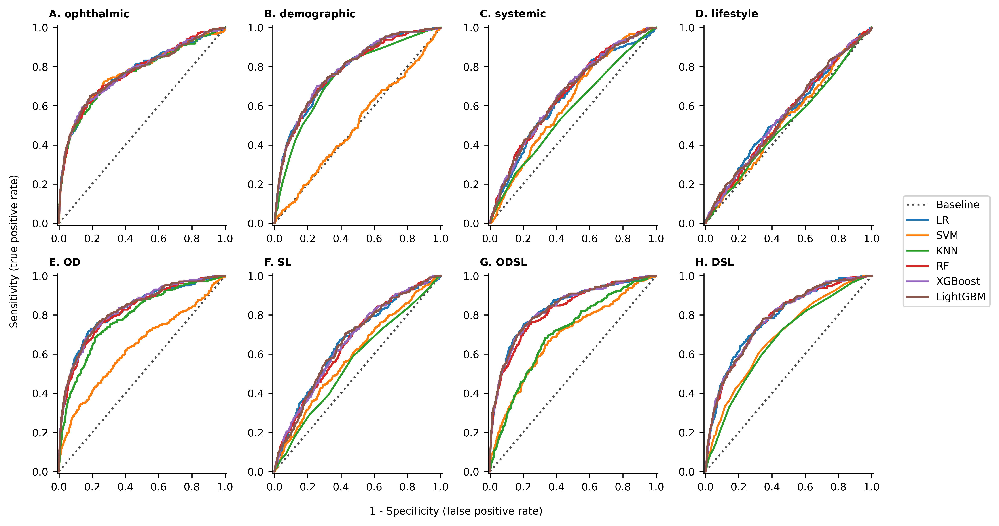

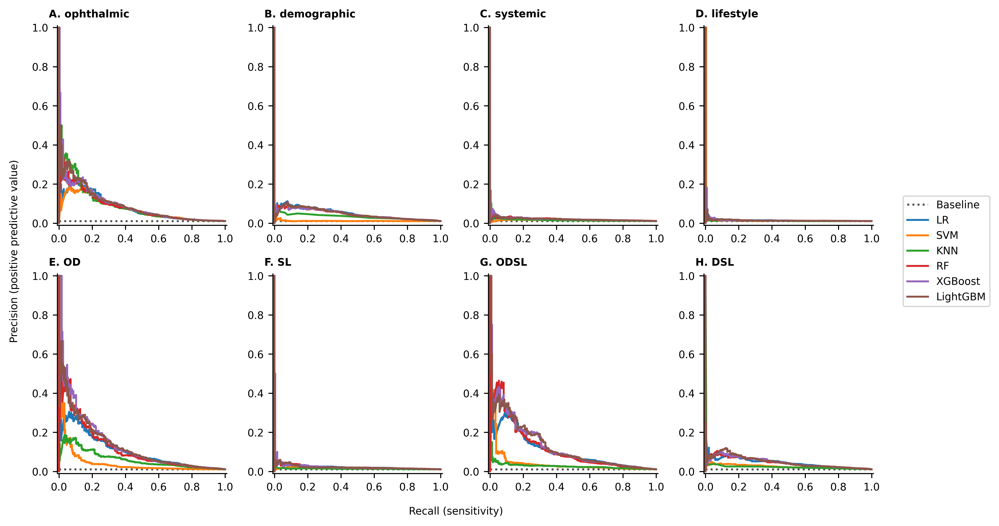

In [33]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_rnfl10year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_10year_tte,
        #y_test_10year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_rnfl10year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_rnfl10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_rnfl10year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_rnfl10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_rnfl10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## No IOP RNFL

In [39]:
model_feature_dict = compare_feature_set_dict = {
    'ophthalmic': feature_sets_rnfl.ophthalmic_features['feature'].values[~np.isin(feature_sets_rnfl.ophthalmic_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'demographic': feature_sets_rnfl.demographic_features['feature'].values,
    'systemic': feature_sets_rnfl.systemic_features['feature'].values,
    'lifestyle': feature_sets_rnfl.lifestyle_features['feature'].values,

    'OD': feature_sets_rnfl.OD_features['feature'].values[~np.isin(feature_sets_rnfl.OD_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'SL': feature_sets_rnfl.SL_features['feature'].values,
    'ODSL': feature_sets_rnfl.ODSL_features['feature'].values[~np.isin(feature_sets_rnfl.ODSL_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'DSL': feature_sets_rnfl.DSL_features['feature'].values}


In [42]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_10year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_10year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_10year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_10year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_10year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_10year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_10year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_noIOPrnfl10year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_noIOPnoIOPrnfl10year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_noIOPrnfl10year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

In [ ]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_noIOPrnfl10year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_10year_tte,
        #y_test_10year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_noIOPrnfl10year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_noIOPrnfl10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_noIOPrnfl10year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_noIOPrnfl10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_noIOPrnfl10year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_noIOPrnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl10year_tte,alpha: 1.0276692958294668e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.746300,0.746 (0.709 - 0.782),0.617 (0.556 - 0.679),0.802 (0.797 - 0.807),0.034 (0.028 - 0.039),0.995 (0.994 - 0.996),0.064 (0.054 - 0.074),0.061 (0.045 - 0.081)
SVM,svm_noIOPrnfl10year_tte,C: 0.8695685363183853 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.694809,0.695 (0.656 - 0.733),0.576 (0.514 - 0.638),0.749 (0.743 - 0.755),0.025 (0.021 - 0.029),0.994 (0.992 - 0.995),0.048 (0.040 - 0.056),0.038 (0.028 - 0.051)
KNN,knn_noIOPrnfl10year_tte,n_neighbors: 487 weights: uniform metric: cosine algorithm: brute,0.746295,0.746 (0.713 - 0.778),0.597 (0.535 - 0.658),0.783 (0.777 - 0.788),0.030 (0.025 - 0.035),0.994 (0.993 - 0.995),0.057 (0.048 - 0.066),0.060 (0.042 - 0.083)
RF,randomforest_noIOPrnfl10year_tte,n_estimators: 218 max_depth: 21 max_features: 0.9975285520652978 min_samples_leaf: 230 max_samples: 0.5502282029520987 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.801420,0.801 (0.772 - 0.830),0.749 (0.694 - 0.803),0.715 (0.709 - 0.721),0.029 (0.025 - 0.033),0.996 (0.995 - 0.997),0.055 (0.048 - 0.063),0.078 (0.057 - 0.107)
XGBoost,xgboost_noIOPrnfl10year_tte,n_estimators: 489 learning_rate: 0.19254063550920522 max_depth: 3 subsample: 0.7325651353605789 colsample_bytree: 0.6912112903256298 gamma: 0.0027743265799125183 lambda: 795.5463342985412 min_child_weight: 2.761401265023866 max_bin: 829 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.780341,0.780 (0.746 - 0.813),0.642 (0.581 - 0.702),0.802 (0.797 - 0.807),0.035 (0.030 - 0.041),0.995 (0.994 - 0.996),0.066 (0.057 - 0.076),0.089 (0.063 - 0.123)
LightGBM,lightgbm_noIOPrnfl10year_tte,n_estimators: 110 max_bin: 860 learning_rate: 0.04320158997465739 max_depth: 5 num_leaves: 12 bagging_fraction: 0.5545029515155515 feature_fraction: 0.7954169141911553 lambda_l2: 0.0844937393899176 min_sum_hessian_in_leaf: 0.06515886867563511 min_data_in_leaf: 2621 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.774336,0.774 (0.741 - 0.807),0.712 (0.654 - 0.768),0.709 (0.703 - 0.716),0.027 (0.023 - 0.031),0.995 (0.994 - 0.997),0.052 (0.044 - 0.059),0.085 (0.061 - 0.116)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: KNN (knn_noIOPrnfl10year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl10year_tte,alpha: 1.0095217867694145e-05 learning_rate: constant eta0: 0.03534768924429081 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.741663,0.742 (0.710 - 0.771),0.765 (0.710 - 0.817),0.601 (0.594 - 0.607),0.021 (0.018 - 0.024),0.996 (0.994 - 0.997),0.041 (0.035 - 0.047),0.037 (0.028 - 0.050)
SVM,svm_noIOPrnfl10year_tte,C: 0.11781277084014069 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.562169,0.562 (0.526 - 0.597),0.749 (0.692 - 0.802),0.373 (0.366 - 0.379),0.013 (0.011 - 0.015),0.993 (0.991 - 0.994),0.026 (0.022 - 0.030),0.013 (0.011 - 0.016)
KNN,knn_noIOPrnfl10year_tte,n_neighbors: 497 weights: distance metric: euclidean algorithm: brute,0.879304,0.879 (0.853 - 0.904),0.770 (0.716 - 0.821),0.857 (0.853 - 0.862),0.057 (0.049 - 0.065),0.997 (0.996 - 0.998),0.106 (0.092 - 0.120),0.388 (0.326 - 0.451)
RF,randomforest_noIOPrnfl10year_tte,n_estimators: 452 max_depth: 6 max_features: 0.5962077931648904 min_samples_leaf: 338 max_samples: 0.8937697965157932 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.763459,0.763 (0.733 - 0.792),0.638 (0.578 - 0.699),0.778 (0.772 - 0.783),0.031 (0.026 - 0.036),0.995 (0.994 - 0.996),0.059 (0.051 - 0.069),0.057 (0.038 - 0.082)
XGBoost,xgboost_noIOPrnfl10year_tte,n_estimators: 250 learning_rate: 0.022245166047915432 max_depth: 3 subsample: 0.5206722928627662 colsample_bytree: 0.9447736063006804 gamma: 0.026121831685412347 lambda: 9.49319953301269 min_child_weight: 0.008805146035381817 max_bin: 336 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.753205,0.753 (0.722 - 0.783),0.638 (0.578 - 0.698),0.749 (0.744 - 0.755),0.028 (0.023 - 0.032),0.995 (0.993 - 0.996),0.053 (0.045 - 0.061),0.051 (0.035 - 0.074)
LightGBM,lightgbm_noIOPrnfl10year_tte,n_estimators: 383 max_bin: 305 learning_rate: 0.006534769011123539 max_depth: 3 num_leaves: 113 bagging_fraction: 0.7032948655693475 feature_fraction: 0.7940606065104612 lambda_l2: 0.04945590137739787 min_sum_hessian_in_leaf: 0.003353360329417154 min_data_in_leaf: 1409 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.753808,0.754 (0.723 - 0.783),0.658 (0.598 - 0.717),0.735 (0.729 - 0.741),0.027 (0.023 - 0.031),0.995 (0.994 - 0.996),0.052 (0.044 - 0.060),0.051 (0.034 - 0.075)


systemic
LR
